# Business Understanding

**Deskripsi Bisnis**

Dalam era saat ini, analisis data menjadi kunci dalam pengambilan keputusan bisnis di berbagai sektor. Tulisan ini bertujuan untuk menjelaskan tujuan dan konteks bisnis dari analisis data pada dataset Home Credit Default Risk yang dapat diakses di Kaggle. Dengan pemahaman yang lebih baik, kita dapat melihat pentingnya analisis data ini dalam konteks bisnis Home Credit.
Home Credit adalah perusahaan yang memberikan pinjaman kepada individu tanpa riwayat kredit tradisional. Tujuan utama mereka adalah memastikan pinjaman dapat diakses oleh semua orang, terutama mereka yang sulit memperoleh pinjaman dari lembaga keuangan tradisional. Home Credit menggunakan sumber data alternatif, seperti data ponsel dan riwayat transaksi, untuk menilai kelayakan peminjam dan menawarkan produk keuangan yang sesuai. Namun, Salah satu tantangan yang umum dihadapi oleh sebagian besar perusahaan finansial teknologi adalah risiko gagal bayar nasabah. Gagal bayar terjadi saat nasabah tidak mampu memenuhi kewajiban pembayaran pinjaman yang mereka miliki. Hal tersebut didukung oleh data kaggle yang mengungkapkan bahwa sebesar 8% nasabah telah mengalami gagal bayar. Oleh karena itu, sangat penting bagi perusahaan Home Credit untuk melakukan dan menemukan cara dalam meminimalkan resiko gagal bayar pada nasabah.

**Tujuan Bisnis**

Dataset Home Credit Default Risk sangat penting dalam mencapai tujuan bisnis berikut:

1. Meningkatkan Penilaian Risiko Kredit:
Home Credit ingin meningkatkan akurasi dalam menilai risiko kredit. Mereka menggunakan dataset ini untuk menganalisis data historis, seperti riwayat pinjaman dan perilaku pembayaran, serta faktor-faktor sosial dan ekonomi. Dengan demikian, mereka berharap dapat mengembangkan model prediksi yang membantu mengidentifikasi calon peminjam yang berpotensi gagal membayar. Tujuan dari analisis ini adalah untuk mengurangi risiko gagal bayar dan meningkatkan akurasi dalam persetujuan pinjaman.
2. Meningkatkan Segmentasi Pelanggan:
Home Credit berusaha memahami kebutuhan dan preferensi pelanggan agar dapat menawarkan produk dan layanan yang sesuai. Dengan menganalisis dataset ini, Home Credit dapat mengidentifikasi kelompok pelanggan yang berbeda. Informasi ini digunakan untuk membuat profil pelanggan, menargetkan segmen pasar tertentu, dan menyesuaikan produk pinjaman. Tujuan dari analisis ini adalah untuk meningkatkan strategi segmentasi pelanggan dan meningkatkan kepuasan pelanggan.
3. Menentukan Harga dan Syarat Pinjaman yang Optimal:
Home Credit perlu menentukan harga dan syarat pinjaman yang adil dan sesuai agar tetap kompetitif. Dengan menganalisis dataset ini, Home Credit dapat memahami hubungan antara karakteristik pinjaman, atribut peminjam, dan risiko gagal bayar. Informasi ini digunakan untuk menentukan harga yang menguntungkan dan syarat pinjaman yang meminimalkan risiko gagal bayar. Tujuan dari analisis ini adalah untuk mengoptimalkan harga dan syarat pinjaman, sehingga dapat meningkatkan jumlah pelanggan dan mengurangi risiko gagal bayar.


**Solusi dengan Analisis Data**

Masalah utama yang ingin diselesaikan yaitu meningkatkan akurasi prediksi risiko gagal bayar pada pinjaman kredit rumah. Dengan data yang tersedia di kaggle, peneliti ingin menggunakan beberapa macam Machine Learning. Dengan harapan model prediksi yang kuat, perusahaan dapat mengidentifikasi pelamar yang berpotensi gagal bayar dan mengurangi risiko kredit. Model tersebut akan dicoba untuk mengidentifikasi pola dan hubungan yang dapat menunjukkan risiko gagal bayar yang lebih tinggi.



# Initialize Data

In [ ]:
#Import Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import sys
import missingno as msno

# to visualise al the columns in the dataframe
pd.pandas.set_option('display.max_columns', None)

In [ ]:
#Import data
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c home-credit-default-risk
!unzip home-credit-default-risk.zip

100% 685M/688M [00:25<00:00, 33.8MB/s]
100% 688M/688M [00:25<00:00, 28.4MB/s]
Archive:  home-credit-default-risk.zip
  inflating: HomeCredit_columns_description.csv  
  inflating: POS_CASH_balance.csv    
  inflating: application_test.csv    
  inflating: application_train.csv   
  inflating: bureau.csv              
  inflating: bureau_balance.csv      
  inflating: credit_card_balance.csv  
  inflating: installments_payments.csv  
  inflating: previous_application.csv  
  inflating: sample_submission.csv   


In [ ]:
#Membaca file csv
application_df = pd.read_csv('application_train.csv')
pos_cash_balance_df = pd.read_csv('POS_CASH_balance.csv')
bureau_df = pd.read_csv('bureau.csv')
bureau_balance_df = pd.read_csv('bureau_balance.csv')
cc_balance_df = pd.read_csv('credit_card_balance.csv')
installments_payments_df = pd.read_csv('installments_payments.csv')
previous_application_df = pd.read_csv('previous_application.csv')

In [ ]:
datasets = {
    'application': application_df,
    'pos_cash_balance': pos_cash_balance_df,
    'bureau': bureau_df,
    'bureau_balance': bureau_balance_df,
    'credit_card_balance': cc_balance_df,
    'installments_payments': installments_payments_df,
    'previous_application': previous_application_df
}

# Data Understanding

Konteks data adalah suatu hal yang perlu dipahami agar dapat mengerti permasalahan apa yang sedang dihadapi sehingga dapat menemukan solusi yang bisa menyelesaikannya.

## Application Dataset

Application Dataset merupakan tabel utama yang berisi sebuah kumpulan data terkait risiko default pinjaman rumah dari perusahaan Home Credit. Data ini mencakup informasi aplikasi kredit dari berbagai nasabah, termasuk atribut pribadi, informasi keuangan, dan riwayat kredit.

### Deskripsi Data

In [ ]:
application_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Melalui output di atas, terlihat variabel-variabel apa saja yang terdapat di dalam dataset  Application Train ***Home Credit Default Risk***. Perusahaan terkait ingin mengetahui peminjam mana saja yang mampu membayar dan tidak mampu membayar kembali pinjaman kredit yang sudah mereka ajukan, sehingga perlu dibuat machine learning yang mampu memprediksi secara real time kondisi tersebut. Data application train ini mengandung variabel-variabel yang menggambarkan kondisi peminjam yang mengajukan pinjaman kredit. Perusahaan berharap data tersebut dapat membantu mencapai tujuan yang diinginkan. Sebelum pembuatan machine learning dilakukan, perlu diketahui karakteristik dari kolom-kolom dalam dataset dan dicari sekiranya variabel apa saja yang berkorelasi dengan variabel target.

In [ ]:
#Jumlah Baris dan Kolom
application_df.shape

(307511, 122)

Berdasarkan output di atas diketahui jumlah baris dan kolom dari dataset *Application Train Home Credit Default Risk* yaitu sebanyak 307511 baris dan 122 kolom atau dapat dikatakan bahwa 307511 adalah jumlah peminjam yang akan diteliti datanya berdasarkan 122 variabel yang ada. Selanjutnya akan dijelaskan karakteristik dari kolom-kolom (variabel) yang ada dalam dataset.


In [ ]:
# Karakteristik Kolom-Kolom dalam Dataset
application_df.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3',

In [ ]:
#Pengecekan unik value
nunique_app = application_df.nunique().sort_values(ascending = False)
print(nunique_app.to_string())

SK_ID_CURR                      307511
EXT_SOURCE_2                    119831
EXT_SOURCE_1                    114584
DAYS_BIRTH                       17460
DAYS_REGISTRATION                15688
AMT_ANNUITY                      13672
DAYS_EMPLOYED                    12574
DAYS_ID_PUBLISH                   6168
AMT_CREDIT                        5603
LIVINGAREA_MODE                   5301
LIVINGAREA_MEDI                   5281
LIVINGAREA_AVG                    5199
TOTALAREA_MODE                    5116
BASEMENTAREA_MODE                 3841
BASEMENTAREA_AVG                  3780
DAYS_LAST_PHONE_CHANGE            3773
BASEMENTAREA_MEDI                 3772
LANDAREA_MODE                     3563
LANDAREA_MEDI                     3560
LANDAREA_AVG                      3527
NONLIVINGAREA_MODE                3327
NONLIVINGAREA_MEDI                3323
NONLIVINGAREA_AVG                 3290
COMMONAREA_MEDI                   3202
COMMONAREA_AVG                    3181
COMMONAREA_MODE          

In [ ]:
# Pengecekan info data
application_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

Berdasarkan informasi di atas, diketahui bahwa jumlah baris dan kolom sudah sesuai yaitu 307511 baris dan 122 kolom. Namun, karena variabel SK_ID-CURR merupakan data non-numerik yang hanya bertujuan untuk memberi tahu id pinjaman dan tidak berpengaruh terhadap analisis, maka variabel ini dapat dihilangkan.

Selain itu, berdasarkan output juga diketahui terdapat 65 kolom yang memiliki tipe data float64, 41 kolom memiliki tipe data int64, dan 16 kolom bertipe data objects. Namun, apabila diteliti lagi, ternyata terdapat beberapa kolom yang tipe datanya belum sesuai dengan yang seharusnya sehingga perlu diperbaiki. Kesalahan tipe data yang dimaksud adalah:

FLAG_MOBIL, FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL seharusnya bertipe object karena merupakan data kategorik dengan 2 kategori (1=yes atau 2=no)

REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY seharusnya bertipe object karena merupakan data kategorik dengan 2 kategori (1=different atau 2=same)

FLAG_DOCUMENT_2, FLAG_DOCUMENT_3, FLAG_DOCUMENT_4, FLAG_DOCUMENT_5, FLAG_DOCUMENT_6, FLAG_DOCUMENT_7, FLAG_DOCUMENT_8, FLAG_DOCUMENT_9, FLAG_DOCUMENT_10, FLAG_DOCUMENT_11, FLAG_DOCUMENT_12, FLAG_DOCUMENT_13, FLAG_DOCUMENT_14, FLAG_DOCUMENT_15, FLAG_DOCUMENT_16, FLAG_DOCUMENT_17, FLAG_DOCUMENT_18, FLAG_DOCUMENT_19, FLAG_DOCUMENT_20, FLAG_DOCUMENT_21 seharusnya bertipe object karena merupakan data kategorik dengan 2 kategori (1=yes atau 2=no)

Berdasarkan intrepretasi tersebut dibutuhkan penyesuaian beberapa type variabel

In [ ]:
#Mendeskripsikan data
application_df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [ ]:
#Ubah data type
columns_to_convert = [
    'SK_ID_CURR',
    'FLAG_MOBIL',
    'FLAG_EMP_PHONE',
    'FLAG_WORK_PHONE',
    'FLAG_CONT_MOBILE',
    'FLAG_PHONE',
    'FLAG_EMAIL',
    'REGION_RATING_CLIENT',
    'REGION_RATING_CLIENT_W_CITY',
    'REG_REGION_NOT_LIVE_REGION',
    'REG_REGION_NOT_WORK_REGION',
    'LIVE_REGION_NOT_WORK_REGION',
    'REG_CITY_NOT_LIVE_CITY',
    'REG_CITY_NOT_WORK_CITY',
    'LIVE_CITY_NOT_WORK_CITY',
    'FLAG_DOCUMENT_2',
    'FLAG_DOCUMENT_3',
    'FLAG_DOCUMENT_4',
    'FLAG_DOCUMENT_5',
    'FLAG_DOCUMENT_6',
    'FLAG_DOCUMENT_7',
    'FLAG_DOCUMENT_8',
    'FLAG_DOCUMENT_9',
    'FLAG_DOCUMENT_10',
    'FLAG_DOCUMENT_11',
    'FLAG_DOCUMENT_12',
    'FLAG_DOCUMENT_13',
    'FLAG_DOCUMENT_14',
    'FLAG_DOCUMENT_15',
    'FLAG_DOCUMENT_16',
    'FLAG_DOCUMENT_17',
    'FLAG_DOCUMENT_18',
    'FLAG_DOCUMENT_19',
    'FLAG_DOCUMENT_20',
    'FLAG_DOCUMENT_21',
]

application_df[columns_to_convert] = application_df[columns_to_convert].astype('category')

In [ ]:
#Pengecekan data type setelah convert data
dtype_application = application_df.dtypes
print(dtype_application.to_string())

SK_ID_CURR                      category
TARGET                             int64
NAME_CONTRACT_TYPE                object
CODE_GENDER                       object
FLAG_OWN_CAR                      object
FLAG_OWN_REALTY                   object
CNT_CHILDREN                       int64
AMT_INCOME_TOTAL                 float64
AMT_CREDIT                       float64
AMT_ANNUITY                      float64
AMT_GOODS_PRICE                  float64
NAME_TYPE_SUITE                   object
NAME_INCOME_TYPE                  object
NAME_EDUCATION_TYPE               object
NAME_FAMILY_STATUS                object
NAME_HOUSING_TYPE                 object
REGION_POPULATION_RELATIVE       float64
DAYS_BIRTH                         int64
DAYS_EMPLOYED                      int64
DAYS_REGISTRATION                float64
DAYS_ID_PUBLISH                    int64
OWN_CAR_AGE                      float64
FLAG_MOBIL                      category
FLAG_EMP_PHONE                  category
FLAG_WORK_PHONE 

Setelah dilakukan koversi tipe data, maka tipe data pada variabel sudah sesuai

### Pembagian kategorik dan numerik

In [ ]:
#Memanggil variabel kategorik
cats=[i for i in application_df.columns if application_df[i].dtypes == 'object' and i!='TARGET']
cats

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [ ]:
#Memanggil variabel numerik
nums=[i for i in application_df.columns if application_df[i].dtypes != 'object' and i!='TARGET' and i!='SK_ID_CURR']
nums

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXP

In [ ]:
for col in cats:
    print(f'''Value count kolom {col}:''')
    print(application_df[col].value_counts())
    print()

Value count kolom NAME_CONTRACT_TYPE:
Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

Value count kolom CODE_GENDER:
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

Value count kolom FLAG_OWN_CAR:
N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

Value count kolom FLAG_OWN_REALTY:
Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

Value count kolom NAME_TYPE_SUITE:
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

Value count kolom NAME_INCOME_TYPE:
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

Va

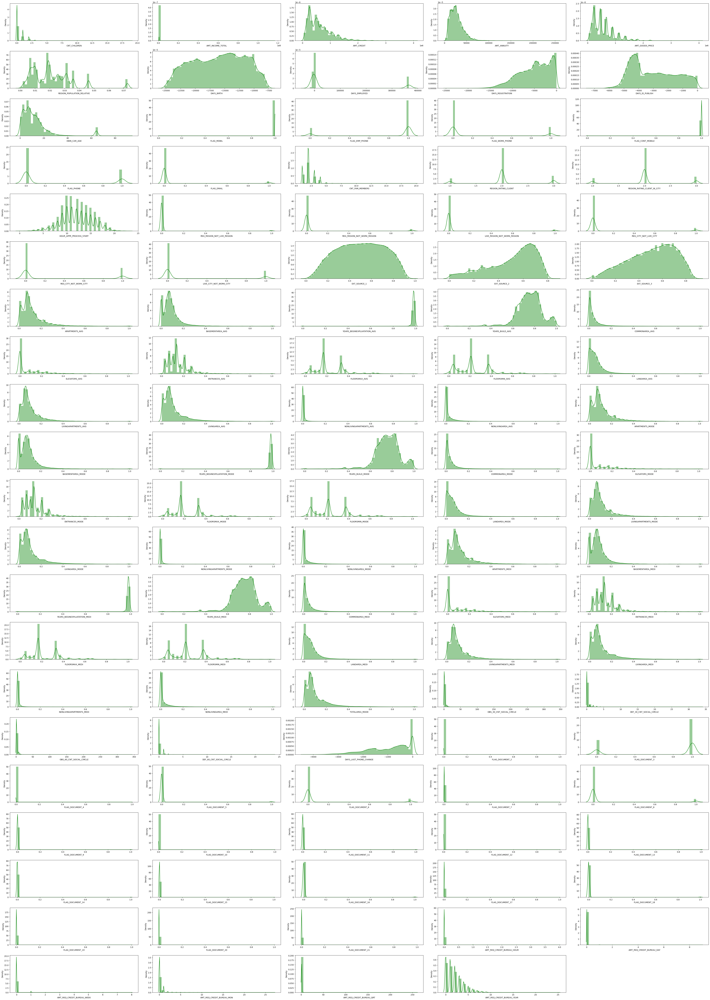

In [ ]:
warnings.filterwarnings("ignore", category=UserWarning, module=".*distplot.*")

plt.figure(figsize=(50, 100))
for i in range(0, len(nums)):
    plt.subplot(30, 5, i+1)
    sns.distplot(application_df[nums[i]], color='green')
    plt.tight_layout()

### Korelasi dengan TARGET

<Axes: >

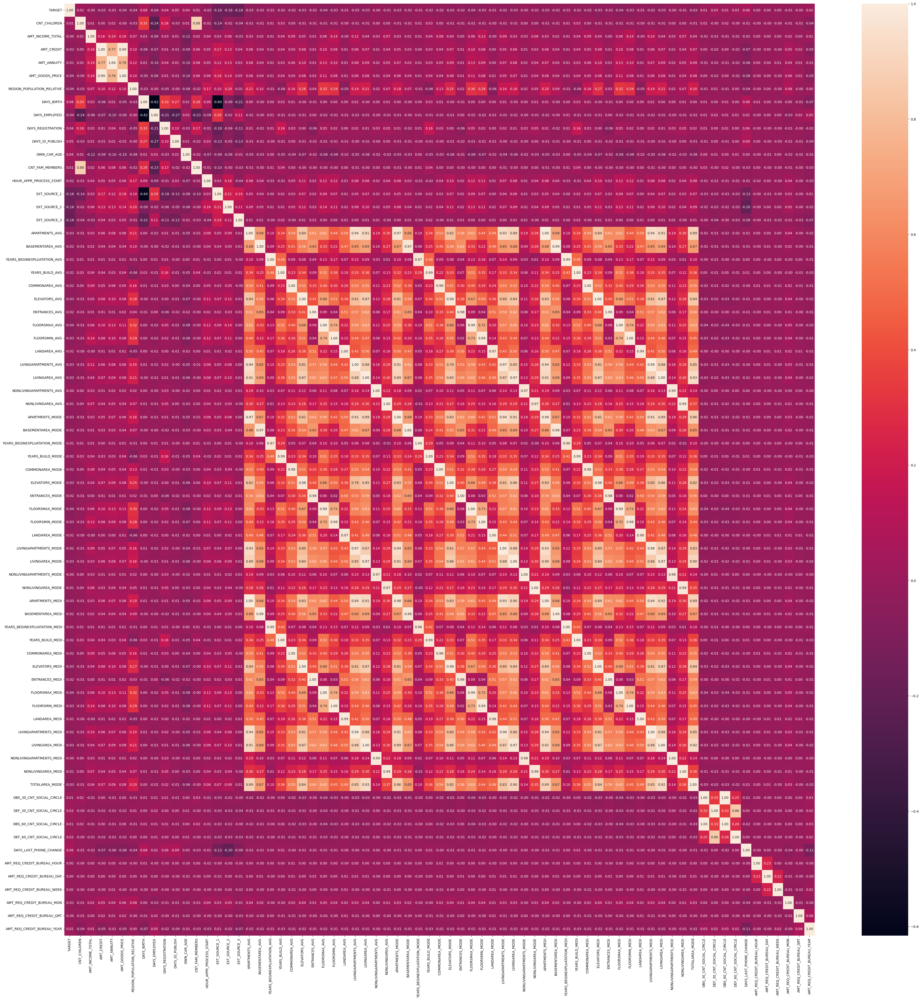

In [ ]:
# Visualisasi heatmap korelasi matriks
plt.figure(figsize=(50, 50))
sns.heatmap(application_df.corr(), annot=True, fmt='.2f')

Berdasarkan heatmap tersebut telah ditunjukkan bahwa semakin cerah / gelap warna matrixnya maka semakin berkorelasi antara variabel satu dengan variabel lainnya.




In [ ]:
#Mencari korelasi antara fitur
correlations_app = application_df.corr()
print(correlations_app.to_string())

                                TARGET  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  CNT_FAM_MEMBERS  HOUR_APPR_PROCESS_START  EXT_SOURCE_1  EXT_SOURCE_2  EXT_SOURCE_3  APARTMENTS_AVG  BASEMENTAREA_AVG  YEARS_BEGINEXPLUATATION_AVG  YEARS_BUILD_AVG  COMMONAREA_AVG  ELEVATORS_AVG  ENTRANCES_AVG  FLOORSMAX_AVG  FLOORSMIN_AVG  LANDAREA_AVG  LIVINGAPARTMENTS_AVG  LIVINGAREA_AVG  NONLIVINGAPARTMENTS_AVG  NONLIVINGAREA_AVG  APARTMENTS_MODE  BASEMENTAREA_MODE  YEARS_BEGINEXPLUATATION_MODE  YEARS_BUILD_MODE  COMMONAREA_MODE  ELEVATORS_MODE  ENTRANCES_MODE  FLOORSMAX_MODE  FLOORSMIN_MODE  LANDAREA_MODE  LIVINGAPARTMENTS_MODE  LIVINGAREA_MODE  NONLIVINGAPARTMENTS_MODE  NONLIVINGAREA_MODE  APARTMENTS_MEDI  BASEMENTAREA_MEDI  YEARS_BEGINEXPLUATATION_MEDI  YEARS_BUILD_MEDI  COMMONAREA_MEDI  ELEVATORS_MEDI  ENTRANCES_MEDI  FLOORSMAX_MEDI  FLOORSMIN_MEDI  LANDAREA_MEDI  

In [ ]:
# Mencari variabel yang memiliki korelasi terkuat baik positif maupun negatif
correlations = application_df.corr()['TARGET'].sort_values()
print('\n The Most Positive Correlations:\n', correlations.tail(10))
print('\n The Most Negative Correlations:\n', correlations.head(10))


 The Most Positive Correlations:
 CNT_CHILDREN                  0.019187
AMT_REQ_CREDIT_BUREAU_YEAR    0.019930
DEF_60_CNT_SOCIAL_CIRCLE      0.031276
DEF_30_CNT_SOCIAL_CIRCLE      0.032248
OWN_CAR_AGE                   0.037612
DAYS_REGISTRATION             0.041975
DAYS_ID_PUBLISH               0.051457
DAYS_LAST_PHONE_CHANGE        0.055218
DAYS_BIRTH                    0.078239
TARGET                        1.000000
Name: TARGET, dtype: float64

 The Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


Dari pengujian korelasi tersebut didapatkan bahwa variabel 'EXT_SOURCE_3' merupakan variabel yang memiliki korelasi terbesar terhadap 'TARGET'

## Bureau Dataset

Bureau Dataset adalah kumpulan data yang terkait dengan riwayat kredit nasabah pada lembaga kredit eksternal. Data ini mencakup informasi mengenai pinjaman sebelumnya yang dimiliki oleh nasabah, termasuk riwayat pembayaran, jumlah kredit yang diberikan, dan status pembayaran. Data bureau digunakan dalam analisis untuk memperoleh pemahaman lebih mendalam tentang kebiasaan pembayaran dan histori kredit nasabah sebelumnya, yang dapat membantu dalam memprediksi risiko default pada pinjaman yang diajukan kepada perusahaan Home Credit.

### Deskripsi Data

In [ ]:
bureau_df

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


Berdasarkan output di atas diketahui jumlah baris dan kolom dari dataset *Bureau Home Credit Default Risk* yaitu sebanyak 1716428 baris dan 17 kolom atau dapat dikatakan bahwa 1716428 adalah jumlah kredit yang dimiliki klien di Biro Kredit sebelum tanggal aplikasi.berdasarkan 17 variabel yang ada. Dataset ini terhubung dengan data set Application dengan SK_ID_CURR sebagai foreign key di kedua tabel.


In [ ]:
# Pengecekan info data
bureau_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   SK_ID_CURR              1716428 non-null  int64  
 1   SK_ID_BUREAU            1716428 non-null  int64  
 2   CREDIT_ACTIVE           1716428 non-null  object 
 3   CREDIT_CURRENCY         1716428 non-null  object 
 4   DAYS_CREDIT             1716428 non-null  int64  
 5   CREDIT_DAY_OVERDUE      1716428 non-null  int64  
 6   DAYS_CREDIT_ENDDATE     1610875 non-null  float64
 7   DAYS_ENDDATE_FACT       1082775 non-null  float64
 8   AMT_CREDIT_MAX_OVERDUE  591940 non-null   float64
 9   CNT_CREDIT_PROLONG      1716428 non-null  int64  
 10  AMT_CREDIT_SUM          1716415 non-null  float64
 11  AMT_CREDIT_SUM_DEBT     1458759 non-null  float64
 12  AMT_CREDIT_SUM_LIMIT    1124648 non-null  float64
 13  AMT_CREDIT_SUM_OVERDUE  1716428 non-null  float64
 14  CR

In [ ]:
# Tipe data
dtype_bureau = bureau_df.dtypes
print(dtype_bureau.to_string())

SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int64
CREDIT_DAY_OVERDUE          int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG          int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int64
AMT_ANNUITY               float64


In [ ]:
bureau_df.describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


Dataset "bureau" pada Kaggle Home Credit Default Risk Competition berhubungan dengan dataset "application_test" melalui kolom "SK_ID_CURR". Kolom "SK_ID_CURR" adalah kunci yang digunakan untuk menghubungkan data nasabah antara kedua dataset tersebut. Informasi yang terdapat dalam dataset "bureau" dapat digunakan sebagai variabel independen dalam melakukan prediksi risiko default pada dataset "application_test". Dengan menggunakan kolom "SK_ID_CURR" sebagai referensi, kita dapat menggabungkan data dari kedua dataset tersebut.

### Aggregate dengan Dataset Application

In [ ]:
# Aggegrat grup melalui SK_ID_CURR
grouped = bureau_df.groupby('SK_ID_CURR')

aggregations = {
    'DAYS_CREDIT': ['min', 'max', 'mean'],
    'CREDIT_DAY_OVERDUE': ['max', 'mean'],
    'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['max', 'mean'],
    'CNT_CREDIT_PROLONG': ['sum'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_LIMIT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['max', 'mean', 'sum'],
    'DAYS_CREDIT_UPDATE': ['min', 'max', 'mean'],
    'AMT_ANNUITY': ['max', 'mean', 'sum'],
}

bureau_agg_df = grouped.agg(aggregations)
bureau_agg_df.columns = ['_'.join(col).strip() for col in bureau_agg_df.columns.values]

application_df = application_df.join(bureau_agg_df, on='SK_ID_CURR', how='left')

In [ ]:
#Menjumlahkan 'CREDIT_ACTIVE''CREDIT_ACTIVE'
credit_active_counts = bureau_df.groupby('SK_ID_CURR')['CREDIT_ACTIVE'].value_counts().unstack().add_prefix('CREDIT_ACTIVE_')
bureau_agg_df = bureau_agg_df.merge(credit_active_counts, left_index=True, right_index=True, how='left')

# Menjumlahkan 'CREDIT_ACTIVE''CREDIT_CURRENCY'
credit_currency_counts = bureau_df.groupby('SK_ID_CURR')['CREDIT_CURRENCY'].value_counts().unstack().add_prefix('CREDIT_CURRENCY_')
bureau_agg_df = bureau_agg_df.merge(credit_currency_counts, left_index=True, right_index=True, how='left')

# Menjumlahkan 'CREDIT_TYPE'
credit_type_counts = bureau_df.groupby('SK_ID_CURR')['CREDIT_TYPE'].value_counts().unstack().add_prefix('CREDIT_CURRENCY_')
bureau_agg_df = bureau_agg_df.merge(credit_type_counts, left_index=True, right_index=True, how='left')

In [ ]:
# Join aggregrat data
application_df = application_df.join(credit_active_counts, on='SK_ID_CURR', how='left')
application_df = application_df.join(credit_currency_counts, on='SK_ID_CURR', how='left')

In [ ]:
application_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_mean,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,AMT_CREDIT_MAX_OVERDUE_max,AMT_CREDIT_MAX_OVERDUE_mean,CNT_CREDIT_PROLONG_sum,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_sum,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_DEBT_sum,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_LIMIT_sum,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_CREDIT_SUM_OVERDUE_sum,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,DAYS_CREDIT_UPDATE_mean,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_ANNUITY_sum,CREDIT_ACTIVE_Active,CREDIT_ACTIVE_Bad debt,CREDIT_ACTIVE_Closed,CREDIT_ACTIVE_Sold,CREDIT_CURRENCY_currency 1,CREDIT_CURRENCY_currency 2,CREDIT_CURRENCY_currency 3,CREDIT_CURRENCY_currency 4
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,-1437.0,-103.0,-874.000000,0.0,0.0,-1072.0,780.0,-349.000000,5043.645,1681.029,0.0,450000.0,108131.945625,865055.565,245781.0,49156.20000,245781.00,31988.565,7997.14125,31988.565,0.0,0.0,0.0,-1185.0,-7.0,-499.875000,0.0,0

Setelah dilakukan aggregrat data bureau ke dalam data application maka didapatkan penambahan kolom sehingga menjadi 159 kolom

### Korelasi dengan TARGET

In [ ]:
# Compute correlations with 'TARGET' for the new columns
new_columns = [col for col in application_df.columns if col in bureau_agg_df.columns]
correlations = application_df[new_columns + ['TARGET']].corr()['TARGET'].drop('TARGET')

# Sort correlations by their absolute values in descending order
correlations = correlations.sort_values(key=lambda x: x.abs(), ascending=False)

# Print correlations
print(correlations.to_string())

CREDIT_CURRENCY_currency 3     0.104134
DAYS_CREDIT_mean               0.089729
DAYS_CREDIT_min                0.075248
DAYS_CREDIT_UPDATE_mean        0.068927
CREDIT_ACTIVE_Active           0.060928
DAYS_CREDIT_max                0.049782
DAYS_CREDIT_ENDDATE_mean       0.046983
DAYS_CREDIT_UPDATE_min         0.042864
DAYS_CREDIT_ENDDATE_max        0.036590
CREDIT_CURRENCY_currency 2    -0.036243
DAYS_CREDIT_ENDDATE_min        0.034281
DAYS_CREDIT_UPDATE_max         0.028234
AMT_CREDIT_SUM_mean           -0.019957
AMT_CREDIT_SUM_max            -0.019737
CREDIT_ACTIVE_Sold            -0.014613
CREDIT_ACTIVE_Closed          -0.014476
AMT_CREDIT_SUM_sum            -0.014057
AMT_CREDIT_SUM_OVERDUE_sum     0.013335
AMT_CREDIT_SUM_LIMIT_mean     -0.011446
AMT_CREDIT_SUM_LIMIT_max      -0.010633
AMT_CREDIT_SUM_OVERDUE_max     0.010614
AMT_CREDIT_SUM_LIMIT_sum      -0.009419
CREDIT_DAY_OVERDUE_mean        0.008118
AMT_CREDIT_SUM_OVERDUE_mean    0.007150
AMT_CREDIT_SUM_DEBT_sum        0.007144


Dari pengujian korelasi tersebut didapatkan bahwa variabel 'CREDIT_CURRENCY_currency 3' merupakan variabel yang memiliki korelasi terbesar terhadap 'TARGET'

## Bureau Balance Dataset

Dataset "bureau_balance" pada Kaggle Home Credit Default Risk Competition adalah dataset yang menyediakan informasi tentang sejarah saldo kredit nasabah pada lembaga kredit luar (non-Home Credit) sebelum pengajuan pinjaman pada Home Credit. Informasi yang terdapat dalam dataset "bureau_balance" mencakup tanggal laporan saldo, status pembayaran, jumlah pinjaman yang diberikan, serta berbagai metrik lainnya terkait kredit nasabah. Data ini dapat digunakan untuk melihat sejarah pembayaran nasabah pada kredit sebelumnya dan mendapatkan wawasan tentang perilaku keuangan mereka.

### Deskripsi Data

In [ ]:
bureau_balance_df

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


Berdasarkan output di atas diketahui jumlah baris dan kolom dari dataset Bureau Balance Home Credit Default Risk yaitu sebanyak 27299925 baris dan 3 kolom.

In [ ]:
# Pengecekan info data
bureau_balance_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Non-Null Count     Dtype 
---  ------          --------------     ----- 
 0   SK_ID_BUREAU    27299925 non-null  int64 
 1   MONTHS_BALANCE  27299925 non-null  int64 
 2   STATUS          27299925 non-null  object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [ ]:
dtype_bureau_balance = bureau_balance_df.dtypes
print(dtype_bureau_balance.to_string())

SK_ID_BUREAU       int64
MONTHS_BALANCE     int64
STATUS            object


In [ ]:
bureau_balance_df.describe()

,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


### Aggregate dengan Dataset Bureau Balance

 Dataset ini terkait dengan dataset "bureau", di mana setiap entri dalam "bureau_balance" terkait dengan entri dalam "bureau" melalui kolom "SK_ID_BUREAU". Sehingga perlu dilakukan aggregrat dengan tabel 'Bureau'

In [ ]:
aggregations = {
    'MONTHS_BALANCE': ['min', 'mean'],
}

In [ ]:
# Apply the aggregations
bureau_balance_agg_df = bureau_balance_df.groupby("SK_ID_BUREAU").agg(aggregations)
bureau_balance_agg_df.columns = ['_'.join(col).strip() for col in bureau_balance_agg_df.columns.values]

# Finally, join the aggregated data with the application data
bureau_df = bureau_df.join(bureau_balance_agg_df, on='SK_ID_BUREAU', how='left')

In [ ]:
bureau_df

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,MONTHS_BALANCE_min,MONTHS_BALANCE_mean
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN,NaN,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN,NaN,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN,NaN,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN,NaN,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN,NaN,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN,NaN,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN,NaN,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN,NaN,NaN


Setalah dilakukan aggregrat antara tabel 'bureau' dan 'bureau balance' dihasilkan kolom sebenyak 19

###Aggregate dengan Dataset Application

Dengan menggabungkan dataset "bureau_balance" dengan dataset "bureau" dan dataset pengajuan pinjaman lainnya seperti "application_train" atau "application_test", kita dapat memperoleh pemahaman yang lebih lengkap tentang profil kredit nasabah dan memprediksi risiko default pada pinjaman yang diajukan kepada Home Credit.

In [ ]:
aggregations = {
    'MONTHS_BALANCE_min': ['mean'],
    'MONTHS_BALANCE_mean': ['mean'],
}

In [ ]:
# Apply the aggregations
bureau_agg_df = bureau_df.groupby("SK_ID_CURR").agg(aggregations)
bureau_agg_df.columns = ['_'.join(col).strip() for col in bureau_agg_df.columns.values]

# Finally, join the aggregated data with the application data
application_df = application_df.join(bureau_agg_df, on='SK_ID_CURR', how='left')

In [ ]:
application_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_mean,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,AMT_CREDIT_MAX_OVERDUE_max,AMT_CREDIT_MAX_OVERDUE_mean,CNT_CREDIT_PROLONG_sum,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_sum,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_DEBT_sum,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_LIMIT_sum,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_CREDIT_SUM_OVERDUE_sum,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,DAYS_CREDIT_UPDATE_mean,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_ANNUITY_sum,CREDIT_ACTIVE_Active,CREDIT_ACTIVE_Bad debt,CREDIT_ACTIVE_Closed,CREDIT_ACTIVE_Sold,CREDIT_CURRENCY_currency 1,CREDIT_CURRENCY_currency 2,CREDIT_CURRENCY_currency 3,CREDIT_CURRENCY_currency 4,MONTHS_BALANCE_min_mean,MONTHS_BALANCE_mean_mean
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,-1437.0,-103.0,-874.000000,0.0,0.0,-1072.0,780.0,-349.000000,5043.645,1681.029,0.0,450000.0,108131.945625,865055.565,245781.0,49156.20000,245781.00,31988.565,7997.14125,319

Setelah dilakukan aggregrat didapatkan penambahan kolom sebanyak 161

### Korelasi dengan TARGET

In [ ]:
# Compute correlations with 'TARGET' for the new columns
new_columns = [col for col in application_df.columns if col in bureau_agg_df.columns]
correlations = application_df[new_columns + ['TARGET']].corr()['TARGET'].drop('TARGET')

# Sort correlations by their absolute values in descending order
correlations = correlations.sort_values(key=lambda x: x.abs(), ascending=False)

# Print correlations
print(correlations.to_string())

MONTHS_BALANCE_min_mean     0.089038
MONTHS_BALANCE_mean_mean    0.076424


## Previous Application Dataset

Dataset "previous_application" pada Kaggle Home Credit Default Risk Competition adalah dataset yang berisi informasi mengenai pengajuan pinjaman sebelumnya yang diajukan oleh nasabah kepada lembaga keuangan selain Home Credit. Dataset ini mencakup data dari aplikasi sebelumnya yang diajukan oleh nasabah, termasuk detail tentang jenis pinjaman, tanggal pengajuan, keputusan pengajuan, dan karakteristik lainnya.

### Deskripsi Data

In [ ]:
previous_application_df

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


Berdasarkan output di atas diketahui jumlah baris dan kolom dari dataset *Previous Application Home Credit Default Risk* yaitu sebanyak 1670214 baris dan 37 kolom.

In [ ]:
# Pengecekan info data
previous_application_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

Terdapat beberapa nilai SK_ID_CURR yang kembar, sehingga memiliki hubungan one-to-many dengan dataset application

In [ ]:
# Tipe data
dtype_previous = previous_application_df.dtypes
print(dtype_previous.to_string())

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In [ ]:
previous_application_df.nunique()

SK_ID_PREV                     1670214
SK_ID_CURR                      338857
NAME_CONTRACT_TYPE                   4
AMT_ANNUITY                     357959
AMT_APPLICATION                  93885
AMT_CREDIT                       86803
AMT_DOWN_PAYMENT                 29278
AMT_GOODS_PRICE                  93885
WEEKDAY_APPR_PROCESS_START           7
HOUR_APPR_PROCESS_START             24
FLAG_LAST_APPL_PER_CONTRACT          2
NFLAG_LAST_APPL_IN_DAY               2
RATE_DOWN_PAYMENT               207033
RATE_INTEREST_PRIMARY              148
RATE_INTEREST_PRIVILEGED            25
NAME_CASH_LOAN_PURPOSE              25
NAME_CONTRACT_STATUS                 4
DAYS_DECISION                     2922
NAME_PAYMENT_TYPE                    4
CODE_REJECT_REASON                   9
NAME_TYPE_SUITE                      7
NAME_CLIENT_TYPE                     4
NAME_GOODS_CATEGORY                 28
NAME_PORTFOLIO                       5
NAME_PRODUCT_TYPE                    3
CHANNEL_TYPE             

In [ ]:
columns_to_convert = [
    'SK_ID_PREV',
    'SK_ID_CURR',
]

previous_application_df[columns_to_convert] = previous_application_df[columns_to_convert].astype('category')


### Aggregate dengan Dataset Application

Dataset "Previous Application Dataset" pada Kaggle Home Credit Default Risk Competition berhubungan dengan dataset "application_test" melalui kolom "SK_ID_CURR". Kolom "SK_ID_CURR" adalah kunci yang digunakan untuk menghubungkan data nasabah antara kedua dataset tersebut. Sehingga diperlukan aggregrat pada data

In [ ]:
aggregations = {
    'AMT_CREDIT': ['min', 'max', 'mean'],
    'CNT_PAYMENT': ['sum'],
    'AMT_ANNUITY': ['min', 'max', 'mean'],
    'AMT_GOODS_PRICE': ['min', 'max', 'mean']
}

In [ ]:
# Apply the aggregations
application_agg_df = previous_application_df.groupby("SK_ID_CURR").agg(aggregations)
application_agg_df.columns = ['_'.join(col).strip() for col in application_agg_df.columns.values]

In [ ]:
# Calculate counts for each category of 'PRODUCT_COMBINATION'
product_combination_count = previous_application_df.groupby('SK_ID_CURR')['PRODUCT_COMBINATION'].value_counts().unstack().add_prefix('PRODUCT_COMBINATION_')

In [ ]:
application_agg_df

,AMT_CREDIT_min,AMT_CREDIT_max,AMT_CREDIT_mean,CNT_PAYMENT_sum,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_GOODS_PRICE_min,AMT_GOODS_PRICE_max,AMT_GOODS_PRICE_mean
SK_ID_CURR,,,,,,,,,,
100001,23787.0,23787.0,23787.00,8.0,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500
100002,179055.0,179055.0,179055.00,24.0,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000
100003,68053.5,1035882.0,484191.00,30.0,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500
100004,20106.0,20106.0,20106.00,4.0,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000
100005,0.0,40153.5,20076.75,12.0,4813.200,4813.200,4813.200000,44617.5,44617.5,44617.500
...,...,...,...,...,...,...,...,...,...,...
456251,40455.0,40455.0,40455.00,8.0,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000
456252,56821.5,56821.5,56821.50,6.0,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500
456253,13945.5,27306.0,20625.75,10.0,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750


In [ ]:
# Rename the columns in application_agg_df
application_agg_df.columns = [f"{col}_agg" for col in application_agg_df.columns]

# Merge with the aggregated data
application_agg_df = application_agg_df.merge(product_combination_count, left_index=True, right_index=True, how='left')

# Finally, join the aggregated data with the application data
application_df = application_df.join(application_agg_df, on='SK_ID_CURR', how='left')

In [ ]:
application_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_mean,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,AMT_CREDIT_MAX_OVERDUE_max,AMT_CREDIT_MAX_OVERDUE_mean,CNT_CREDIT_PROLONG_sum,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_sum,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_DEBT_sum,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_LIMIT_sum,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_CREDIT_SUM_OVERDUE_sum,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,DAYS_CREDIT_UPDATE_mean,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_ANNUITY_sum,CREDIT_ACTIVE_Active,CREDIT_ACTIVE_Bad debt,CREDIT_ACTIVE_Closed,CREDIT_ACTIVE_Sold,CREDIT_CURRENCY_currency 1,CREDIT_CURRENCY_currency 2,CREDIT_CURRENCY_currency 3,CREDIT_CURRENCY_currency 4,MONTHS_BALANCE_min_mean,MONTHS_BALANCE_mean_mean,AMT_CREDIT_min_agg,AMT_CREDIT_max_agg,AMT_CREDIT_mean_agg,CNT_PAYMENT_sum_agg,AMT_ANNUITY_min_agg,AMT_ANNUITY_max_agg,AMT_ANNUITY_mean_agg,AMT_GOODS_PRICE_min_agg,AMT_GOODS_PRICE_max_agg,AMT_GOODS_PRICE_mean_agg,PRODUCT_COMBINATION_Card Street,PRODUCT_COMBINATION_Card X-Sell,PRODUCT_COMBINATION_Cash,PRODUCT_COMBINATION_Cash Street: high,PRODUCT_COMBINATION_Cash Street: low,PRODUCT_COMBINATION_Cash Street: middle,PRODUCT_COMBINATION_Cash X-Sell: high,PRODUCT_COMBINATION_Cash X-Sell: low,PRODUCT_COMBINATION_Cash X-Sell: middle,PRODUCT_COMBINATION_POS household with interest,PRODUCT_COMBINATION_POS household without interest,PRODUCT_COMBINATION_POS industry with interest,PRODUCT_COMBINATION_POS industry without interest,PRODUCT_COMBINATION_POS mobile with interest,PRODUCT_COMBINATION_POS mobile without interest,PRODUCT_COMBINATION_POS other with interest,PRODUCT_COMBINATION_POS others without

Dari hasil aggregrat tersebut didapatkan sebanyak 188 kolom

### Korelasi dengan TARGET

In [ ]:
# Compute correlations with 'TARGET' for the new columns
new_columns = [col for col in application_df.columns if col in application_agg_df.columns]
correlations = application_df[new_columns + ['TARGET']].corr()['TARGET'].drop('TARGET')

# Sort correlations by their absolute values in descending order
correlations = correlations.sort_values(key=lambda x: x.abs(), ascending=False)

# Print correlations
print(correlations.to_string())

PRODUCT_COMBINATION_Card Street                       0.049601
AMT_ANNUITY_mean_agg                                 -0.034871
AMT_ANNUITY_min_agg                                  -0.032249
PRODUCT_COMBINATION_Cash X-Sell: high                 0.029879
AMT_ANNUITY_max_agg                                  -0.028966
CNT_PAYMENT_sum_agg                                   0.027716
PRODUCT_COMBINATION_Cash Street: middle               0.027676
PRODUCT_COMBINATION_Cash                              0.027194
PRODUCT_COMBINATION_Card X-Sell                       0.026468
PRODUCT_COMBINATION_Cash Street: low                  0.023666
AMT_GOODS_PRICE_min_agg                              -0.020811
AMT_CREDIT_min_agg                                   -0.019417
AMT_CREDIT_mean_agg                                  -0.016114
PRODUCT_COMBINATION_Cash Street: high                 0.016111
AMT_GOODS_PRICE_mean_agg                             -0.015847
AMT_GOODS_PRICE_max_agg                              -0

## POS CASH Balance Dataset

Dataset "POS_CASH_balance" merupakan dataset yang berisi informasi terkait riwayat pembayaran nasabah pada pinjaman sebelumnya. Dataset ini memberikan gambaran tentang bagaimana nasabah melakukan pembayaran cicilan dan menunjukkan status pembayaran pada setiap periode.

### Deskripsi Data

In [ ]:
pos_cash_balance_df

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


Berdasarkan output di atas diketahui jumlah baris dan kolom dari dataset Pos Cash yaitu sebanyak 10001358 baris dan 8 kolom.

In [ ]:
pos_cash_balance_df.sort_values(by='SK_ID_CURR')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
8531326,1851984,100001,-94,4.0,0.0,Active,0,0
1891462,1851984,100001,-95,4.0,1.0,Active,7,7
8789081,1369693,100001,-56,4.0,3.0,Active,0,0
4704415,1369693,100001,-54,4.0,1.0,Active,0,0
7167007,1369693,100001,-57,4.0,4.0,Active,0,0
...,...,...,...,...,...,...,...,...
3839119,2631384,456255,-6,36.0,16.0,Active,0,0
4876277,2631384,456255,-5,36.0,15.0,Active,0,0
1386050,2631384,456255,-11,36.0,21.0,Active,0,0
3766097,2631384,456255,-25,36.0,35.0,Active,0,0


In [ ]:
# Tipe data
dtype_pos_cash = pos_cash_balance_df.dtypes
print(dtype_pos_cash.to_string())

SK_ID_PREV                 int64
SK_ID_CURR                 int64
MONTHS_BALANCE             int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS      object
SK_DPD                     int64
SK_DPD_DEF                 int64


In [ ]:
pos_cash_balance_df.nunique()

SK_ID_PREV               936325
SK_ID_CURR               337252
MONTHS_BALANCE               96
CNT_INSTALMENT               73
CNT_INSTALMENT_FUTURE        79
NAME_CONTRACT_STATUS          9
SK_DPD                     3400
SK_DPD_DEF                 2307
dtype: int64

In [ ]:
columns_to_convert = [
    'SK_ID_PREV',
    'SK_ID_CURR',
]

pos_cash_balance_df[columns_to_convert] = pos_cash_balance_df[columns_to_convert].astype('category')

### Aggregate dengan Dataset Application

Dataset POS CASH berhubungan dengan Dataset Application melalui ' SK_ID_CURR'

In [ ]:
aggregations = {
    'MONTHS_BALANCE': ['max', 'mean'],
    'CNT_INSTALMENT': ['sum'],
    'CNT_INSTALMENT_FUTURE': ['sum'],
    'SK_DPD': ['sum'],
    'SK_DPD_DEF': ['sum']
}

In [ ]:
# Apply the aggregations
application_agg_df = pos_cash_balance_df.groupby("SK_ID_CURR").agg(aggregations)
application_agg_df.columns = ['_'.join(col).strip() for col in application_agg_df.columns.values]

In [ ]:
# Rename the columns in application_agg_df
application_agg_df.columns = [f"pos_cash_{col}" for col in application_agg_df.columns]

# Finally, join the aggregated data with the application data
application_df = application_df.join(application_agg_df, on='SK_ID_CURR', how='left')

### Korelasi dengan TARGET

In [ ]:
# Compute correlations with 'TARGET' for the new columns
new_columns = [col for col in application_df.columns if col in application_agg_df.columns]
correlations = application_df[new_columns + ['TARGET']].corr()['TARGET'].drop('TARGET')

# Sort correlations by their absolute values in descending order
correlations = correlations.sort_values(key=lambda x: x.abs(), ascending=False)

# Print correlations
print(correlations.to_string())

pos_cash_MONTHS_BALANCE_mean          0.034543
pos_cash_CNT_INSTALMENT_sum          -0.014670
pos_cash_CNT_INSTALMENT_FUTURE_sum   -0.005881
pos_cash_SK_DPD_DEF_sum               0.004950
pos_cash_SK_DPD_sum                   0.004740
pos_cash_MONTHS_BALANCE_max          -0.004321


## Installments Payments Dataset

Dataset "installments_payments" pada kompetisi Home Credit Default Risk di Kaggle merupakan dataset yang berisi informasi mengenai pembayaran angsuran dari pinjaman sebelumnya yang dilakukan oleh nasabah. Dataset ini memberikan detail tentang pembayaran angsuran seperti tanggal pembayaran, jumlah pembayaran yang dilakukan, dan apakah pembayaran dilakukan tepat waktu atau terlambat.

### Deskripsi Data

In [ ]:
installments_payments_df

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


Berdasarkan output tersebut didapatkan baris sebanyak 13605401 dan kolom sebanyak 8

In [ ]:
installments_payments_df.sort_values(by='SK_ID_CURR')

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
3458712,1369693,100001,1.0,3,-1649.0,-1660.0,3951.000,3951.000
3435373,1851984,100001,1.0,4,-2856.0,-2856.0,3980.925,3980.925
2624024,1369693,100001,2.0,4,-1619.0,-1628.0,17397.900,17397.900
1761012,1851984,100001,1.0,2,-2916.0,-2916.0,3982.050,3982.050
3774071,1851984,100001,1.0,3,-2886.0,-2875.0,3982.050,3982.050
...,...,...,...,...,...,...,...,...
11551234,2631384,456255,3.0,4,-666.0,-692.0,27489.690,27489.690
13087700,1179690,456255,1.0,13,-302.0,-301.0,28873.170,28873.170
11589266,1743609,456255,1.0,4,-870.0,-879.0,11090.835,11090.835
12567614,2631384,456255,3.0,17,-276.0,-301.0,27489.690,737.910


In [ ]:
# Tipe data
dtype_installments_payments = installments_payments_df.dtypes
print(dtype_installments_payments.to_string())

SK_ID_PREV                  int64
SK_ID_CURR                  int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER       int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64


In [ ]:
installments_payments_df.nunique()

SK_ID_PREV                997752
SK_ID_CURR                339587
NUM_INSTALMENT_VERSION        65
NUM_INSTALMENT_NUMBER        277
DAYS_INSTALMENT             2922
DAYS_ENTRY_PAYMENT          3039
AMT_INSTALMENT            902539
AMT_PAYMENT               944235
dtype: int64

In [ ]:
columns_to_convert = [
    'SK_ID_PREV',
    'SK_ID_CURR',
]

installments_payments_df[columns_to_convert] = installments_payments_df[columns_to_convert].astype('category')


### Aggregate dengan Dataset Application

Dataset 'Installments Payments' berhubungan dengan Dataset 'Application' melalui variabel "SK_ID_CURR"

In [ ]:
aggregations = {
    'NUM_INSTALMENT_VERSION': ['mean'],
    'NUM_INSTALMENT_NUMBER': ['sum'],
    'DAYS_INSTALMENT': ['mean'],
    'DAYS_ENTRY_PAYMENT': ['mean'],
    'AMT_INSTALMENT': ['mean'],
    'AMT_PAYMENT': ['mean']
}

In [ ]:
# Apply the aggregations
application_agg_df = installments_payments_df.groupby("SK_ID_CURR").agg(aggregations)
application_agg_df.columns = ['_'.join(col).strip() for col in application_agg_df.columns.values]

In [ ]:
# Rename the columns in application_agg_df
application_agg_df.columns = [f"installments_payments_{col}" for col in application_agg_df.columns]

# Finally, join the aggregated data with the application data
application_df = application_df.join(application_agg_df, on='SK_ID_CURR', how='left')

### Korelasi dengan TARGET

In [ ]:
# Compute correlations with 'TARGET' for the new columns
new_columns = [col for col in application_df.columns if col in application_agg_df.columns]
correlations = application_df[new_columns + ['TARGET']].corr()['TARGET'].drop('TARGET')

# Sort correlations by their absolute values in descending order
correlations = correlations.sort_values(key=lambda x: x.abs(), ascending=False)

# Print correlations
print(correlations.to_string())

Series([], )


## Credit Card Balance Dataset

Dataset "credit_card_balance" merupakan dataset yang berisi informasi tentang saldo dan aktivitas kartu kredit nasabah. Dataset ini memberikan detail tentang transaksi kartu kredit seperti saldo tertunggak, batas kredit, jumlah pembayaran minimum, dan informasi lain terkait penggunaan dan pembayaran kartu kredit.

### Deskripsi Data

In [ ]:
cc_balance_df

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.00,1800.000,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.00,2250.000,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.00,2250.000,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.00,11925.000,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.00,27000.000,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,1879.11,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,375750.00,356994.675,269356.140,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


Berdasarkan dari informasi tersebut, didapatkan bahwa terdapat 3840312 baris dan 23 kolom

In [ ]:
cc_balance_df.sort_values(by='SK_ID_CURR')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
584804,1489396,100006,-1,0.000,270000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.00,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
1399895,1489396,100006,-4,0.000,270000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.00,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
520387,1489396,100006,-2,0.000,270000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.00,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
1636141,1489396,100006,-6,0.000,270000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.00,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
655566,1489396,100006,-5,0.000,270000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.00,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1049726,1794451,456250,-2,158266.935,175500,0.0,0.0,0.0,0.0,8477.730,9675.0,1388.610,156053.16,158266.935,158266.935,0.0,0,0.0,0.0,9.0,Active,0,0
2248506,1794451,456250,-7,174435.885,180000,0.0,0.0,0.0,0.0,9240.705,9675.0,590.625,172012.32,174435.885,174435.885,0.0,0,0.0,0.0,4.0,Active,0,0
3734047,1794451,456250,-9,180536.760,180000,0.0,0.0,0.0,0.0,9653.985,12600.0,3134.295,176418.00,179866.260,179866.260,0.0,0,0.0,0.0,2.0,Active,0,0
140639,1794451,456250,-1,153832.725,175500,0.0,0.0,0.0,0.0,8286.390,9675.0,1600.830,151808.22,153832.725,153832.725,0.0,0,0.0,0.0,10.0,Active,0,0


In [ ]:
dtype_cc_balance = cc_balance_df.dtypes
print(dtype_cc_balance.to_string())

SK_ID_PREV                      int64
SK_ID_CURR                      int64
MONTHS_BALANCE                  int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL         int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT            int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS           object
SK_DPD                          int64
SK_DPD_DEF                      int64


In [ ]:
cc_balance_df.nunique()

SK_ID_PREV                     104307
SK_ID_CURR                     103558
MONTHS_BALANCE                     96
AMT_BALANCE                   1347904
AMT_CREDIT_LIMIT_ACTUAL           181
AMT_DRAWINGS_ATM_CURRENT         2267
AMT_DRAWINGS_CURRENT           187005
AMT_DRAWINGS_OTHER_CURRENT       1832
AMT_DRAWINGS_POS_CURRENT       168748
AMT_INST_MIN_REGULARITY        312266
AMT_PAYMENT_CURRENT            163209
AMT_PAYMENT_TOTAL_CURRENT      182957
AMT_RECEIVABLE_PRINCIPAL      1195839
AMT_RECIVABLE                 1338878
AMT_TOTAL_RECEIVABLE          1339008
CNT_DRAWINGS_ATM_CURRENT           44
CNT_DRAWINGS_CURRENT              129
CNT_DRAWINGS_OTHER_CURRENT         11
CNT_DRAWINGS_POS_CURRENT          133
CNT_INSTALMENT_MATURE_CUM         121
NAME_CONTRACT_STATUS                7
SK_DPD                            917
SK_DPD_DEF                        378
dtype: int64

In [ ]:
columns_to_convert = [
    'SK_ID_PREV',
    'SK_ID_CURR',
]

cc_balance_df[columns_to_convert] = cc_balance_df[columns_to_convert].astype('category')


### Aggregate dengan Application

Dataset 'Credit Card Balance' berhubungan dengan 'Application' melalui "SK_ID_CURR"

In [ ]:
# Define the aggregations
aggregations = {
    'MONTHS_BALANCE': ['min', 'max', 'mean', 'sum'],
    'AMT_BALANCE': ['min', 'max', 'mean', 'sum'],
    'AMT_CREDIT_LIMIT_ACTUAL': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_ATM_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_OTHER_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_POS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_INST_MIN_REGULARITY': ['min', 'max', 'mean', 'sum'],
    'AMT_PAYMENT_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_PAYMENT_TOTAL_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_RECEIVABLE_PRINCIPAL': ['min', 'max', 'mean', 'sum'],
    'AMT_RECIVABLE': ['min', 'max', 'mean', 'sum'],
    'AMT_TOTAL_RECEIVABLE': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_ATM_CURRENT': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_OTHER_CURRENT': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_POS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'CNT_INSTALMENT_MATURE_CUM': ['min', 'max', 'mean', 'sum'],
    'SK_DPD': ['min', 'max', 'mean', 'sum'],
    'SK_DPD_DEF': ['min', 'max', 'mean', 'sum'],
}

In [ ]:
# Apply the aggregation
credit_card_balance_agg_df = cc_balance_df.groupby('SK_ID_CURR').agg(aggregations)
credit_card_balance_agg_df.columns = ['_'.join(col).strip() for col in credit_card_balance_agg_df.columns.values]

In [ ]:
# Calculate counts for each category of 'NAME_CONTRACT_STATUS'
name_contract_count = previous_application_df.groupby('SK_ID_CURR')['NAME_CONTRACT_STATUS'].value_counts().unstack().add_prefix('NAME_CONTRACT_STATUS_')

In [ ]:
# Merge with the aggregated data
credit_card_balance_agg_df = credit_card_balance_agg_df.merge(name_contract_count, left_index=True, right_index=True, how='left')

# Rename the columns in application_agg_df
credit_card_balance_agg_df.columns = [f"cc_balance_{col}" for col in credit_card_balance_agg_df.columns]

# Finally, join the aggregated data with the application data
application_df = application_df.join(credit_card_balance_agg_df, on='SK_ID_CURR', how='left')

### Korelasi dengan TARGET

In [ ]:
# Compute correlations with 'TARGET' for the new columns
new_columns = [col for col in application_df.columns if col in credit_card_balance_agg_df.columns]
correlations = application_df[new_columns + ['TARGET']].corr()['TARGET'].drop('TARGET')

# Sort correlations by their absolute values in descending order
correlations = correlations.sort_values(key=lambda x: x.abs(), ascending=False)

# Print correlations
print(correlations.to_string())

cc_balance_CNT_DRAWINGS_ATM_CURRENT_mean        0.107692
cc_balance_CNT_DRAWINGS_CURRENT_max             0.101389
cc_balance_AMT_BALANCE_mean                     0.087177
cc_balance_AMT_TOTAL_RECEIVABLE_mean            0.086490
cc_balance_AMT_RECIVABLE_mean                   0.086478
cc_balance_AMT_RECEIVABLE_PRINCIPAL_mean        0.086062
cc_balance_CNT_DRAWINGS_CURRENT_mean            0.082520
cc_balance_AMT_INST_MIN_REGULARITY_mean         0.073724
cc_balance_CNT_DRAWINGS_POS_CURRENT_max         0.068942
cc_balance_AMT_BALANCE_max                      0.068798
cc_balance_AMT_TOTAL_RECEIVABLE_max             0.068081
cc_balance_AMT_RECIVABLE_max                    0.068066
cc_balance_AMT_RECEIVABLE_PRINCIPAL_max         0.066919
cc_balance_AMT_BALANCE_min                      0.064163
cc_balance_AMT_INST_MIN_REGULARITY_max          0.063888
cc_balance_NAME_CONTRACT_STATUS_Refused         0.063739
cc_balance_CNT_DRAWINGS_ATM_CURRENT_max         0.063729
cc_balance_AMT_RECIVABLE_min   

## Data keseluruhan hasil penggabungan

In [ ]:
application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_mean,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,AMT_CREDIT_MAX_OVERDUE_max,AMT_CREDIT_MAX_OVERDUE_mean,CNT_CREDIT_PROLONG_sum,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_sum,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_DEBT_sum,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_LIMIT_sum,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_CREDIT_SUM_OVERDUE_sum,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,DAYS_CREDIT_UPDATE_mean,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_ANNUITY_sum,CREDIT_ACTIVE_Active,CREDIT_ACTIVE_Bad debt,CREDIT_ACTIVE_Closed,CREDIT_ACTIVE_Sold,CREDIT_CURRENCY_currency 1,CREDIT_CURRENCY_currency 2,CREDIT_CURRENCY_currency 3,CREDIT_CURRENCY_currency 4,MONTHS_BALANCE_min_mean,MONTHS_BALANCE_mean_mean,AMT_CREDIT_min_agg,AMT_CREDIT_max_agg,AMT_CREDIT_mean_agg,CNT_PAYMENT_sum_agg,AMT_ANNUITY_min_agg,AMT_ANNUITY_max_agg,AMT_ANNUITY_mean_agg,AMT_GOODS_PRICE_min_agg,AMT_GOODS_PRICE_max_agg,AMT_GOODS_PRICE_mean_agg,PRODUCT_COMBINATION_Card Street,PRODUCT_COMBINATION_Card X-Sell,PRODUCT_COMBINATION_Cash,PRODUCT_COMBINATION_Cash Street: high,PRODUCT_COMBINATION_Cash Street: low,PRODUCT_COMBINATION_Cash Street: middle,PRODUCT_COMBINATION_Cash X-Sell: high,PRODUCT_COMBINATION_Cash X-Sell: low,PRODUCT_COMBINATION_Cash X-Sell: middle,PRODUCT_COMBINATION_POS household with interest,PRODUCT_COMBINATION_POS household without interest,PRODUCT_COMBINATION_POS industry with interest,PRODUCT_COMBINATION_POS industry without interest,PRODUCT_COMBINATION_POS mobile with interest,PRODUCT_COMBINATION_POS mobile without interest,PRODUCT_COMBINATION_POS other with interest,PRODUCT_COMBINATION_POS others without

## Korelasi Keseluruhan terhadap TARGET

In [ ]:
# Compute correlations with 'TARGET'
correlations = application_df.corr()['TARGET'].sort_values(key=lambda x: x.abs(), ascending=False)

# Print correlations
print(correlations.to_string())

TARGET                                                1.000000
EXT_SOURCE_3                                         -0.178919
EXT_SOURCE_2                                         -0.160472
EXT_SOURCE_1                                         -0.155317
cc_balance_CNT_DRAWINGS_ATM_CURRENT_mean              0.107692
CREDIT_CURRENCY_currency 3                            0.104134
cc_balance_CNT_DRAWINGS_CURRENT_max                   0.101389
DAYS_CREDIT_mean                                      0.089729
MONTHS_BALANCE_min_mean                               0.089038
cc_balance_AMT_BALANCE_mean                           0.087177
cc_balance_AMT_TOTAL_RECEIVABLE_mean                  0.086490
cc_balance_AMT_RECIVABLE_mean                         0.086478
cc_balance_AMT_RECEIVABLE_PRINCIPAL_mean              0.086062
cc_balance_CNT_DRAWINGS_CURRENT_mean                  0.082520
DAYS_BIRTH                                            0.078239
MONTHS_BALANCE_mean_mean                              0

In [ ]:
#Menyimpan data aggregrat di gdrive
application_df.to_csv('application_data_NEW.csv', index=False)

In [ ]:
!cp 'application_data_NEW.csv' '/content/drive/MyDrive/Colab Notebooks/Clean Dataset'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#import data yang sudah di aggregrat
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Clean Dataset')

## Visualisasi Data Kotor

0    282686
1     24825
Name: TARGET, dtype: int64


[Text(0, 0, '282686 (92%)'), Text(0, 0, '24825 (8%)')]

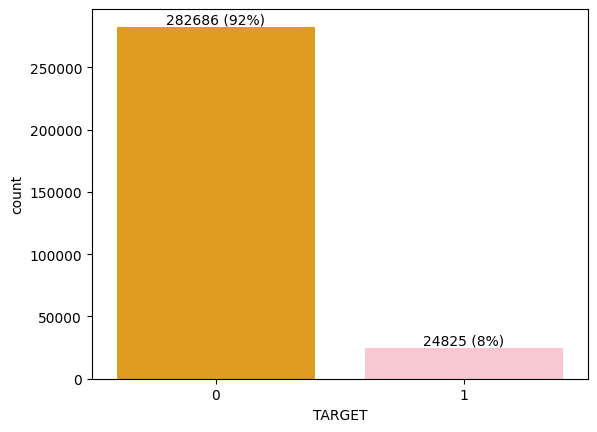

In [ ]:
# Menampilkan distribusi dari variabel target
print(df.TARGET.value_counts())

# Distribusi target
pal = ['pink' if (x < max(df['TARGET'].value_counts())) else 'orange' for x in df['TARGET'].value_counts() ]

ax = sns.countplot(x=df['TARGET'],
                   palette = pal,
                   order=df['TARGET'].value_counts(ascending=False).index);

jmltarget = df["TARGET"].value_counts()
pertarget = (df["TARGET"].value_counts()/df["TARGET"].count())*100

lbl = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(jmltarget, pertarget)]

ax.bar_label(container=ax.containers[0], labels=lbl)

Berdasarkan informasi di atas, dapat diketahui bahwa dataset tidak seimbang karena hanya sekitar 8% dari data target dalam train yang tidak dibayar kembali pinjamannya.

Persentase klien pinjaman cash yang gagal bayar: 8.35 %
Persentase klien pinjaman bergulir yang gagal bayar: 5.48 %


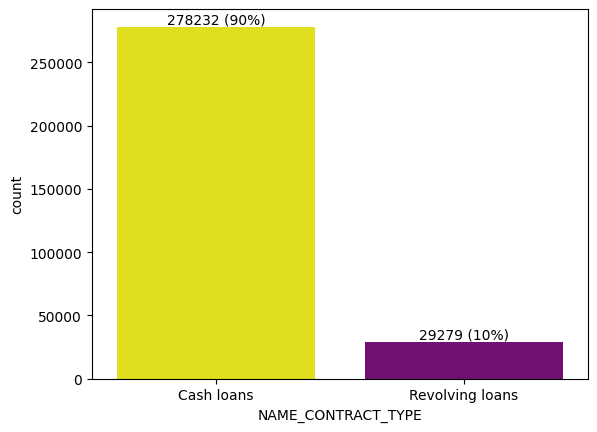

In [ ]:
cash=df[df.NAME_CONTRACT_TYPE == 'Cash loans']
rev=df[df.NAME_CONTRACT_TYPE == 'Revolving loans']
def_cash=cash[cash.TARGET==1]
def_rev=rev[rev.TARGET==1]

print('Persentase klien pinjaman cash yang gagal bayar:',round(len(def_cash)/len(cash)*100,2,),'%')
print('Persentase klien pinjaman bergulir yang gagal bayar:',round(len(def_rev)/len(rev)*100,2),'%')
clrs = ['purple' if (x < max(df['TARGET'].value_counts())) else 'yellow' for x in df['TARGET'].value_counts() ]
ax = sns.countplot(data=df,x='NAME_CONTRACT_TYPE',palette=clrs,
                   order=df['NAME_CONTRACT_TYPE'].value_counts(ascending=False).index);

abs_values =df['NAME_CONTRACT_TYPE'].value_counts(ascending=False)
rel_values =df['NAME_CONTRACT_TYPE'].value_counts(ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]

ax.bar_label(container=ax.containers[0], labels=lbls)

plt.show()

Berdasarkan variabel NAME_CONTRACT_TYPE: Akuntansi untuk mereka yang gagal bayar jauh lebih besar dalam hal pinjaman tunai dibandingkan dengan pinjaman bergulir, namun, kami pinjaman tunai secara signifikan lebih populer bagi klien.

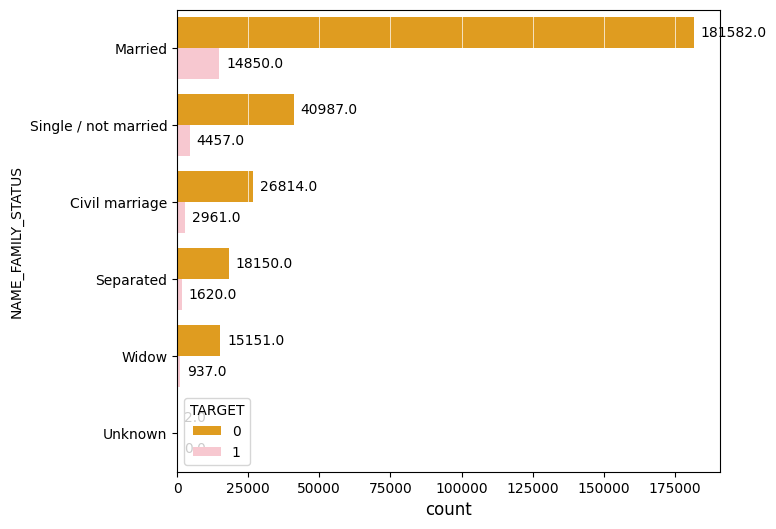

In [ ]:
f, ax = plt.subplots(figsize=(7, 6))

clrs = ['pink' if (x < max(df['NAME_FAMILY_STATUS'].value_counts())) else 'orange' for x in df['NAME_FAMILY_STATUS'].value_counts() ]

sns.countplot(y="NAME_FAMILY_STATUS", data=df, hue='TARGET',palette=clrs,order =df['NAME_FAMILY_STATUS'].value_counts().index)

for p in ax.patches:
  ax.annotate(p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
              xytext=(5, 0), textcoords='offset points', ha="left", va="center")

plt.grid(color='white', axis='x', linestyle='-', linewidth=0.5)
plt.xlabel('count', fontsize=12)
plt.show()

Berdasarkan output di atas, dapat diketahui bahwa mayoritas klien memiliki status married. Pelanggan yang tidak dapat membayar tagihan juga paling banyak berasal dari status Married

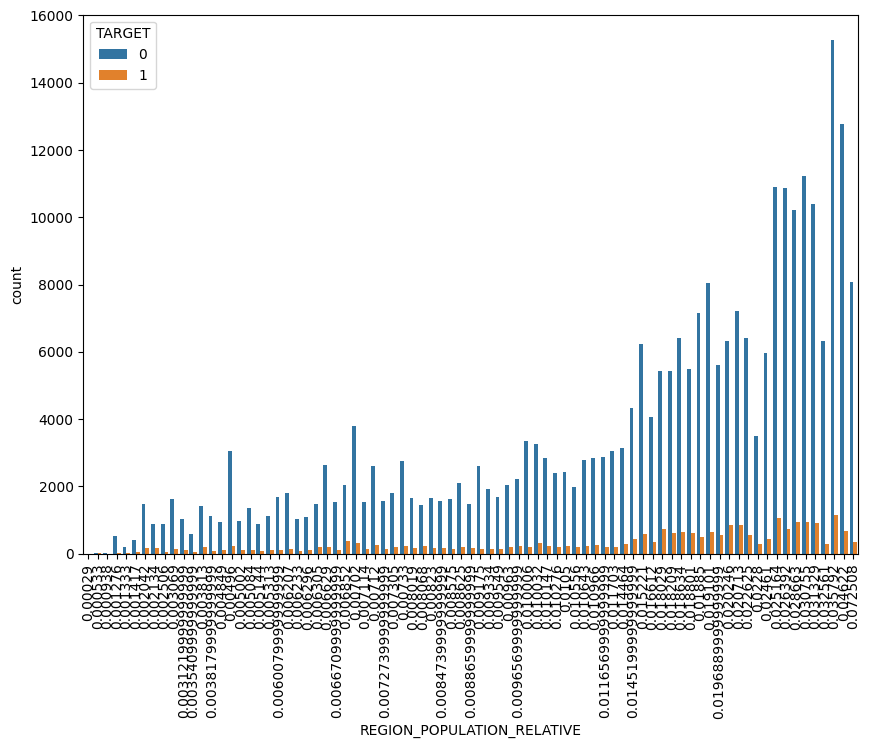

In [ ]:
fig,ax = plt.subplots(figsize=(10,7))
sns.countplot(data=df,x='REGION_POPULATION_RELATIVE',hue='TARGET',ax=ax);
plt.xticks(rotation=90)
plt.show()

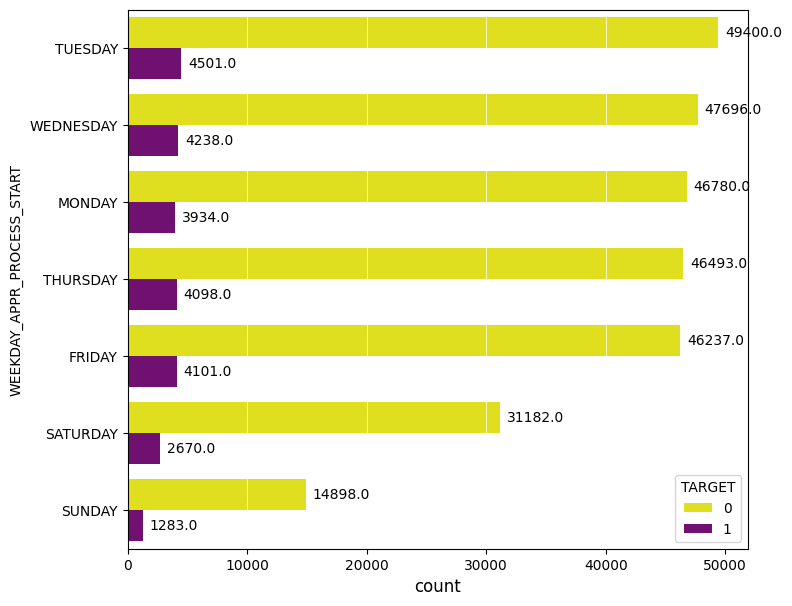

In [ ]:
f, ax = plt.subplots(figsize=(8, 7))

clrs = ['purple' if (x < max(df['WEEKDAY_APPR_PROCESS_START'].value_counts())) else 'yellow' for x in df['WEEKDAY_APPR_PROCESS_START'].value_counts() ]

sns.countplot(y="WEEKDAY_APPR_PROCESS_START", data=df, hue='TARGET',palette=clrs,order =df['WEEKDAY_APPR_PROCESS_START'].value_counts().index)

for p in ax.patches:
  ax.annotate(p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
              xytext=(5, 0), textcoords='offset points', ha="left", va="center")

plt.grid(color='white', axis='x', linestyle='-', linewidth=0.5)
plt.xlabel('count', fontsize=12)
plt.show()

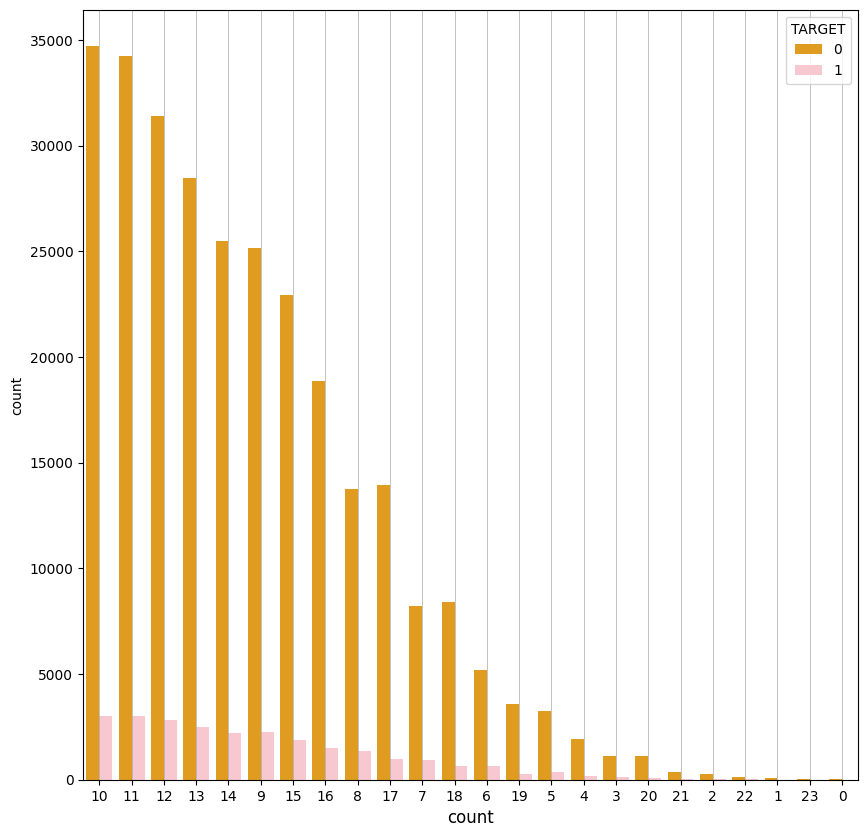

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

clrs = ['pink' if (x < max(df['HOUR_APPR_PROCESS_START'].value_counts())) else 'orange' for x in df_train['HOUR_APPR_PROCESS_START'].value_counts() ]

sns.countplot(x="HOUR_APPR_PROCESS_START", data=df, hue='TARGET',palette=clrs,order =df['HOUR_APPR_PROCESS_START'].value_counts().index, ax=ax)
plt.grid(color='darkgray', axis='x', linestyle='-', linewidth=0.5)
plt.xlabel('count', fontsize=12)
plt.show()

# Data Preparation

Data preparation adalah proses persiapan data sebelum dilakukan analisis atau pemodelan. Tujuannya adalah untuk memastikan bahwa data yang akan digunakan memiliki kualitas yang baik, relevan, dan siap untuk diolah.
Langkah-langkah :
1. Duplicate Data
2. Missing Value
3. Outlier
4. Encoding
5. Visualisasi data

### Deskripsi Data Keseluruhan

In [ ]:
#Menampilkan data
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,cc_balance_SK_DPD_mean,cc_balance_SK_DPD_sum,cc_balance_SK_DPD_DEF_min,cc_balance_SK_DPD_DEF_max,cc_balance_SK_DPD_DEF_mean,cc_balance_SK_DPD_DEF_sum,cc_balance_NAME_CONTRACT_STATUS_Approved,cc_balance_NAME_CONTRACT_STATUS_Canceled,cc_balance_NAME_CONTRACT_STATUS_Refused,cc_balance_NAME_CONTRACT_STATUS_Unused offer
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,0.0,0.0,5.0,3.0,1.0,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Pengecekan info data
df.info(verbose=True, null_counts=True)

<ipython-input-7-b588b839631c>:2: FutureWarning: null_counts is deprecated. Use show_counts instead
  df.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 278 columns):
 #    Column                                              Non-Null Count   Dtype  
---   ------                                              --------------   -----  
 0    SK_ID_CURR                                          307511 non-null  int64  
 1    TARGET                                              307511 non-null  int64  
 2    NAME_CONTRACT_TYPE                                  307511 non-null  object 
 3    CODE_GENDER                                         307511 non-null  object 
 4    FLAG_OWN_CAR                                        307511 non-null  object 
 5    FLAG_OWN_REALTY                                     307511 non-null  object 
 6    CNT_CHILDREN                                        307511 non-null  int64  
 7    AMT_INCOME_TOTAL                                    307511 non-null  float64
 8    AMT_CREDIT                                          

Berdasarkan output tersebut didapatkan bahwa terdapat 277 kolom dengan 307511 baris

### Duplicate Data

In [ ]:
df.duplicated().sum()

0

Berdasarkan hasil tersebut, didapatkan bahwa data tidak terdapat duplicate data

### Missing value

In [ ]:
#Membagi data kategorik
df_cats=[i for i in df.columns if df[i].dtypes == 'object' or'category' and i!='TARGET']
df_cats

['SK_ID_CURR',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEAR

In [ ]:
#Membagi data numerik
df_nums=[i for i in df.columns if df[i].dtypes != 'object' or 'category' and i!='TARGET' ]
df_nums

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_A

In [ ]:
# Mengatur opsi tampilan pandas
pd.set_option('display.max_rows', None)

# fungsi untuk hitung persentase missing value pada DataFrame
def miss_val_percent(df):

    # ambil kolom dengan missing value, jumlahkan missing value
    null_cols = df.columns[df.isnull().any()]
    miss_val_sum = df[null_cols].isnull().sum()

    # ubah menjadi DataFrame, ubah index menjadi 'feature'
    miss_val_df = pd.DataFrame(miss_val_sum, columns=['missing_values'])
    miss_val_df.index.name = 'feature'

    # hitung persentase missing value setiap feature, sorting dan reset index
    miss_val_df['percent'] = miss_val_df['missing_values']. \
    apply(lambda row: round((row / df.shape[0]) * 100, 2)).astype(int)
    miss_val_df.sort_values(by='percent', ascending=False, inplace=True)
    miss_val_df.reset_index(inplace=True)

    return miss_val_df

# apply fungsi untuk hitung persentase missing value
miss_df = miss_val_percent(df)
miss_df

,feature,missing_values,percent
0,CREDIT_CURRENCY_currency 4,307502,100
1,CREDIT_ACTIVE_Bad debt,307491,99
2,CREDIT_CURRENCY_currency 2,306665,99
3,CREDIT_CURRENCY_currency 3,307376,99
4,PRODUCT_COMBINATION_POS others without interest,305621,99
5,CREDIT_ACTIVE_Sold,302285,98
6,cc_balance_NAME_CONTRACT_STATUS_Unused offer,301420,98
7,PRODUCT_COMBINATION_POS industry without interest,298014,96
8,PRODUCT_COMBINATION_POS mobile without interest,289957,94
9,PRODUCT_COMBINATION_POS other with interest,290667,94


Dikarenakan terdapat banyak sekali missing value maka dilakukan penanganan antara lain :


*   Penghapusan data yang hilang:
Jika jumlah missing value relatif besar maka variabel tersebut dilakukan penghapusan. Hal ini dilakukan untuk menjaga integritas data dan menghindari bias.

* Imputasi mean atau median: Missing value pada data numerik dapat diisi dengan nilai rata-rata atau nilai tengah dari kolom yang bersangkutan. Ini mempertahankan statistik dasar data dan mengurangi bias.

* Imputasi modus: Missing value pada data kategorik dapat diisi dengan nilai modus (nilai yang paling sering muncul) dari kolom yang bersangkutan. Ini menjaga proporsi kategori dan mempertahankan informasi penting dalam data.

In [ ]:
#Hapus kolom yang mengandung missing value > 50%
for i in df.columns:
  null = df[i].isnull().sum()
  tol = 0.5*len(df.index)
  if null> tol:
    df = df.drop(columns=[i])

In [ ]:
check_df = miss_val_percent(df)
check_df

,feature,missing_values,percent
0,FLOORSMAX_MEDI,153020,49
1,FLOORSMAX_MODE,153020,49
2,FLOORSMAX_AVG,153020,49
3,YEARS_BEGINEXPLUATATION_MODE,150007,48
4,TOTALAREA_MODE,148431,48
5,YEARS_BEGINEXPLUATATION_MEDI,150007,48
6,YEARS_BEGINEXPLUATATION_AVG,150007,48
7,EMERGENCYSTATE_MODE,145755,47
8,AMT_CREDIT_MAX_OVERDUE_mean,123625,40
9,AMT_CREDIT_MAX_OVERDUE_max,123625,40


Setelah dilakukan pengahpusan missing value > 50% maka didapatkan 72 variabel

In [ ]:
categorical_cols = df.select_dtypes(include='object' or 'category'). \
                    columns[df.select_dtypes(include='object' or 'category').isna().any()].tolist()
numeric_cols = df.select_dtypes(exclude='object') \
                    .columns[df.select_dtypes(exclude='object' or 'category').isna().any()].tolist()
list_cols = check_df['feature'].tolist()

In [ ]:
def compare_lists(list1, list2):
    matching_values = [value for value in list1 if value in list2]
    return matching_values

numeric_null_cols = compare_lists(list_cols, numeric_cols)
categorical_null_cols = compare_lists(list_cols, categorical_cols)

In [ ]:
def impute_numeric_data(df, columns, mode):
    for col in columns:
        if mode == 'median':
            value = df[col].median()
        elif mode == 'mean':
            value = df[col].mean()
        df[col].fillna(value, inplace=True)

    return df

def impute_categoric_data(df, columns):
    for col in columns:
        mode_value = df[col].mode().iloc[0]
        df[col].fillna(mode_value, inplace=True)
    return df

In [ ]:
df = impute_numeric_data(df, numeric_null_cols, 'median')
df = impute_categoric_data(df, categorical_null_cols)

In [ ]:
df.dropna()

In [ ]:
df.isnull().sum()

SK_ID_CURR                            0
TARGET                                0
NAME_CONTRACT_TYPE                    0
CODE_GENDER                           0
FLAG_OWN_CAR                          0
FLAG_OWN_REALTY                       0
CNT_CHILDREN                          0
AMT_INCOME_TOTAL                      0
AMT_CREDIT                            0
AMT_ANNUITY                           0
AMT_GOODS_PRICE                       0
NAME_TYPE_SUITE                       0
NAME_INCOME_TYPE                      0
NAME_EDUCATION_TYPE                   0
NAME_FAMILY_STATUS                    0
NAME_HOUSING_TYPE                     0
REGION_POPULATION_RELATIVE            0
DAYS_BIRTH                            0
DAYS_EMPLOYED                         0
DAYS_REGISTRATION                     0
DAYS_ID_PUBLISH                       0
FLAG_MOBIL                            0
FLAG_EMP_PHONE                        0
FLAG_WORK_PHONE                       0
FLAG_CONT_MOBILE                      0


Setelah dilakukan penanganan missing value maka telah didapatkan tidak ada data yang hilang

### Outlier



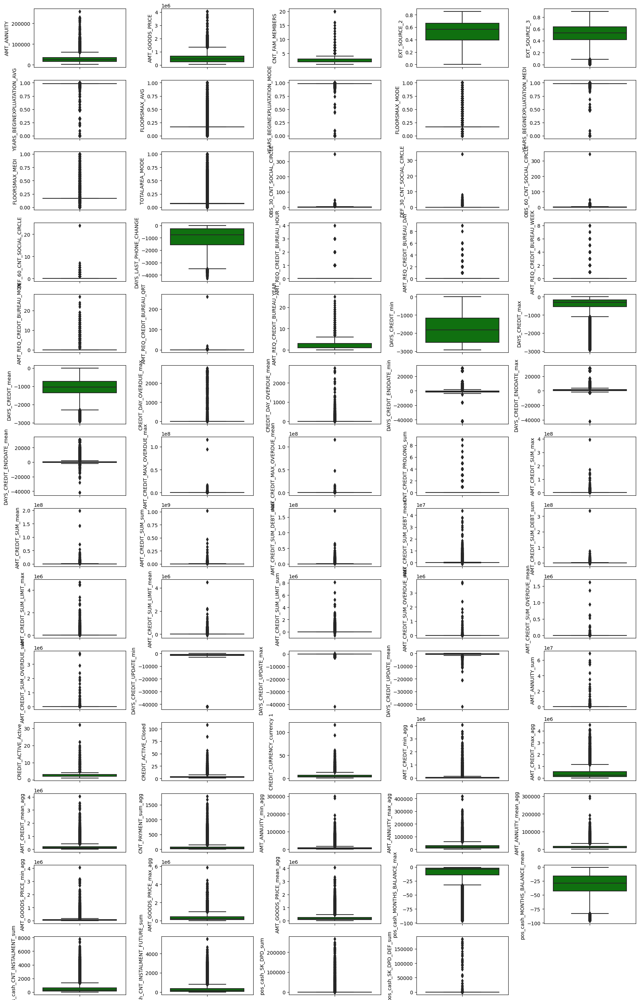

In [ ]:
plt.figure(figsize=(18,50))
for i in range(0, len(numeric_cols)):
    plt.subplot(25, 5, i+1)
    sns.boxplot(y=df[numeric_cols[i]], color='green', orient='v')
    plt.tight_layout()

Berdasarkan boxplot tersebut, didapatkan terjadi banyak outlier. namun hal tersebut tidak bisa dilakukan penghapusan karena masih tetap dapat mencerminkan variasi alami dalam populasi.

In [ ]:
#simpan data bersih, agar tidak merun ulang
df.to_csv('clean_sheet.csv', index=False)

In [ ]:
!cp 'clean_sheet.csv' '/content/drive/MyDrive/Colab Notebooks/Dataset'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#import data yang sudah di aggregrat
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Dataset')

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_ANNUITY_mean_agg,AMT_GOODS_PRICE_min_agg,AMT_GOODS_PRICE_max_agg,AMT_GOODS_PRICE_mean_agg,pos_cash_MONTHS_BALANCE_max,pos_cash_MONTHS_BALANCE_mean,pos_cash_CNT_INSTALMENT_sum,pos_cash_CNT_INSTALMENT_FUTURE_sum,pos_cash_SK_DPD_sum,pos_cash_SK_DPD_DEF_sum
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,9251.775,179055.00,179055.0,179055.00,-1.0,-10.000000,456.0,285.0,0.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,56553.990,68809.50,900000.0,435436.50,-18.0,-43.785714,283.0,162.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,5357.250,24282.00,24282.0,24282.00,-24.0,-25.500000,15.0,9.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,23651.175,26912.34,688500.0,408304.89,-1.0,-9.619048,240.0,173.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,12278.805,17176.50,247500.0,150530.25,-1.0,-33.636364,1012.0,592.0,0.0,0.0


### Korelasi Dengan Data Bersih

In [ ]:
#Mencari korelasi antara fitur yang berbeda
correlations_app = df.corr()
print(correlations_app.to_string())

<ipython-input-4-0cd272c34b4f>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlations_app = df.corr()


                                    SK_ID_CURR    TARGET  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  DAYS_REGISTRATION  DAYS_ID_PUBLISH  FLAG_MOBIL  FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  FLAG_PHONE  FLAG_EMAIL  CNT_FAM_MEMBERS  REGION_RATING_CLIENT  REGION_RATING_CLIENT_W_CITY  HOUR_APPR_PROCESS_START  REG_REGION_NOT_LIVE_REGION  REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION  REG_CITY_NOT_LIVE_CITY  REG_CITY_NOT_WORK_CITY  LIVE_CITY_NOT_WORK_CITY  EXT_SOURCE_2  EXT_SOURCE_3  YEARS_BEGINEXPLUATATION_AVG  FLOORSMAX_AVG  YEARS_BEGINEXPLUATATION_MODE  FLOORSMAX_MODE  YEARS_BEGINEXPLUATATION_MEDI  FLOORSMAX_MEDI  TOTALAREA_MODE  OBS_30_CNT_SOCIAL_CIRCLE  DEF_30_CNT_SOCIAL_CIRCLE  OBS_60_CNT_SOCIAL_CIRCLE  DEF_60_CNT_SOCIAL_CIRCLE  DAYS_LAST_PHONE_CHANGE  FLAG_DOCUMENT_2  FLAG_DOCUMENT_3  FLAG_DOCUMENT_4  FLAG_DOCUMENT_5  FLAG_DOCUMENT_6  FLAG_DOCUMENT_7  FLAG_DOCUMENT_8  FLAG_DOCUMEN

<Axes: >

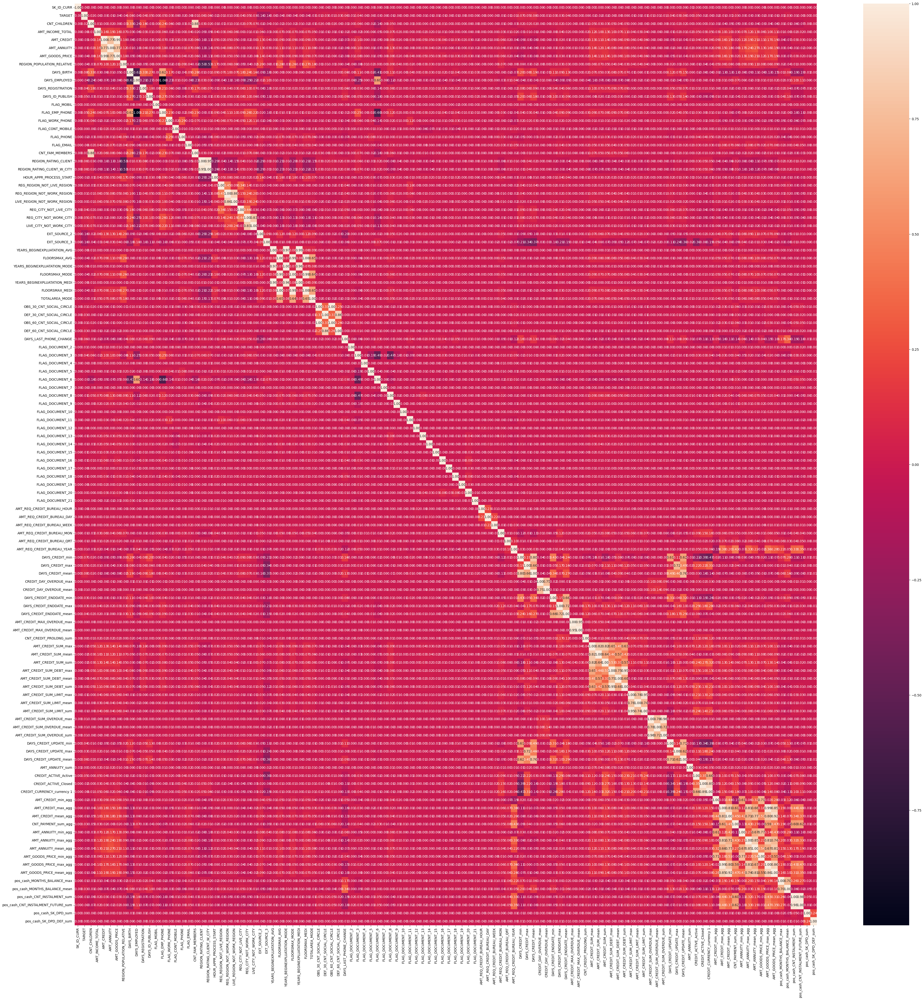

In [ ]:
# Visualisasi heatmap korelasi matriks
plt.figure(figsize=(50, 50))
sns.heatmap(df.corr(), annot=True, fmt='.2f')

In [ ]:
# Mencari variabel yang memiliki korelasi terkuat baik positif maupun negatif
correlations = df.corr()['TARGET'].sort_values()
print('\n The Most Positive Correlations:\n', correlations.tail(10))
print('\n The Most Negative Correlations:\n', correlations.head(10))


 The Most Positive Correlations:
 DAYS_ID_PUBLISH                0.051457
CREDIT_ACTIVE_Active           0.051736
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_CREDIT_UPDATE_mean        0.064120
DAYS_CREDIT_min                0.067388
DAYS_BIRTH                     0.078239
DAYS_CREDIT_mean               0.082079
TARGET                         1.000000
Name: TARGET, dtype: float64

 The Most Negative Correlations:
 EXT_SOURCE_2                 -0.160295
EXT_SOURCE_3                 -0.155892
DAYS_EMPLOYED                -0.044932
AMT_GOODS_PRICE              -0.039623
FLOORSMAX_AVG                -0.039385
FLOORSMAX_MEDI               -0.039157
FLOORSMAX_MODE               -0.038377
REGION_POPULATION_RELATIVE   -0.037227
AMT_ANNUITY_mean_agg         -0.032953
AMT_CREDIT                   -0.030369
Name: TARGET, dtype: float64


### Pengelompokan Data yang Sesuai

In [ ]:
#Membuat tabel yang berisi variabel berkorelasi dengan target, korelasi> 5%
variabel_terpilih = [
    'TARGET',
    'DAYS_ID_PUBLISH',
    'CREDIT_ACTIVE_Active',
    'DAYS_LAST_PHONE_CHANGE',
    'REGION_RATING_CLIENT',
    'REGION_RATING_CLIENT_W_CITY',
    'DAYS_CREDIT_UPDATE_mean',
    'DAYS_CREDIT_min',
    'DAYS_BIRTH',
    'EXT_SOURCE_2']
df_new= df[variabel_terpilih]

In [ ]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 10 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   TARGET                       307511 non-null  int64  
 1   DAYS_ID_PUBLISH              307511 non-null  int64  
 2   CREDIT_ACTIVE_Active         307511 non-null  float64
 3   DAYS_LAST_PHONE_CHANGE       307511 non-null  float64
 4   REGION_RATING_CLIENT         307511 non-null  int64  
 5   REGION_RATING_CLIENT_W_CITY  307511 non-null  int64  
 6   DAYS_CREDIT_UPDATE_mean      307511 non-null  float64
 7   DAYS_CREDIT_min              307511 non-null  float64
 8   DAYS_BIRTH                   307511 non-null  int64  
 9   EXT_SOURCE_2                 307511 non-null  float64
dtypes: float64(5), int64(5)
memory usage: 23.5 MB


***Karakteristik Kolom-Kolom***
1. TARGET : merupakan variabel target (0 = klien yang dapa membayar tagihan, 1
 = klien tidak dapat membayar tagihan)
2. DAYS_ID_PUBLISH : Berapa hari sebelum mengajukan pinjaman, klien mengubah dokumen identitas yang digunakannya untuk mengajukan pinjaman
3. CREDIT_ACTIVE_Active : mengindikasikan status kredit yang aktif
4. DAYS_LAST_PHONE_CHANGE : Berapa hari sebelum mengajukan pinjaman, klien mengganti teleponnya
5. REGION_RATING_CLIENT : rating atau penilaian wilayah tempat tinggal pelanggan
6. REGION_RATING_CLIENT_W_CITY : mengindikasikan rating atau penilaian wilayah tempat tinggal pelanggan dengan mempertimbangkan juga kota
7.  DAYS_CREDIT_UPDATE_mean : nilai rata-rata jumlah hari sejak pembaruan terakhir dalam riwayat kredit pelanggan
8. DAYS_CREDIT_min  : nilai terkecil dari jumlah hari sejak kredit diberikan dalam riwayat kredit pelanggan
9. DAYS_BIRTH : Usia klien (dalam hari) pada saat mengajukan pinjaman
10. EXT_SOURCE_2    : sumber eksternal kedua yang digunakan dalam evaluasi risiko kredit


In [ ]:
df_new.head()

,TARGET,DAYS_ID_PUBLISH,CREDIT_ACTIVE_Active,DAYS_LAST_PHONE_CHANGE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,DAYS_CREDIT_UPDATE_mean,DAYS_CREDIT_min,DAYS_BIRTH,EXT_SOURCE_2
0,1,-2120,2.0,-1134.0,2,2,-499.875000,-1437.0,-9461,0.262949
1,0,-291,1.0,-828.0,1,1,-816.000000,-2586.0,-16765,0.622246
2,0,-2531,2.0,-815.0,2,2,-532.000000,-1326.0,-19046,0.555912
3,0,-2437,2.0,-617.0,2,2,-481.833333,-1827.0,-19005,0.650442
4,0,-3458,2.0,-1106.0,2,2,-783.000000,-1149.0,-19932,0.322738


Sebelum melakukan encoding, sebaiknya kita melakukan pemahaman data terlebih dahulu. Terdapat beberapa variabel yang tidak sesuai dengan Data Type
1. CREDIT_ACTIVE_Active merupakan kategorik (objek)
2. REGION_RATING_CLIENT merupakan kategorik (objek)
3. REGION_RATING_CLIENT_W_CITY merupakan kategorik (objek)

In [ ]:
#Mengubah tipe data variable CREDIT_ACTIVE_Active, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY menjadi object
df_new['CREDIT_ACTIVE_Active'] = df_new['CREDIT_ACTIVE_Active'].astype('Int64')
df_new['REGION_RATING_CLIENT'] = df_new['REGION_RATING_CLIENT'].astype('O')
df_new['REGION_RATING_CLIENT_W_CITY'] = df_new['REGION_RATING_CLIENT_W_CITY'].astype('O')

<ipython-input-7-7e6ed1e972a7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['CREDIT_ACTIVE_Active'] = df_new['CREDIT_ACTIVE_Active'].astype('Int64')
<ipython-input-7-7e6ed1e972a7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['REGION_RATING_CLIENT'] = df_new['REGION_RATING_CLIENT'].astype('O')
<ipython-input-7-7e6ed1e972a7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

### Encoding

Kolom CREDIT_ACTIVE_Active tidak dilakukan encoding karena menunjukkan jumlah credit card yang aktif

In [ ]:
REGION_RATING_CLIENT_dummies = pd.get_dummies(df['REGION_RATING_CLIENT'], prefix='REGION_RATING_CLIENT')
REGION_RATING_CLIENT_dummies.head()

,REGION_RATING_CLIENT_1,REGION_RATING_CLIENT_2,REGION_RATING_CLIENT_3
0,0,1,0
1,1,0,0
2,0,1,0
3,0,1,0
4,0,1,0


In [ ]:
df_new = pd.concat([df_new, REGION_RATING_CLIENT_dummies], axis=1)

In [ ]:
df_new = df_new.drop('REGION_RATING_CLIENT', axis=1)

In [ ]:
REGION_RATING_CLIENT_W_CITY_dummies = pd.get_dummies(df['REGION_RATING_CLIENT_W_CITY'], prefix='REGION_RATING_CLIENT_W_CITY')
REGION_RATING_CLIENT_W_CITY_dummies.head()

,REGION_RATING_CLIENT_W_CITY_1,REGION_RATING_CLIENT_W_CITY_2,REGION_RATING_CLIENT_W_CITY_3
0,0,1,0
1,1,0,0
2,0,1,0
3,0,1,0
4,0,1,0


In [ ]:
df_new = pd.concat([df_new, REGION_RATING_CLIENT_W_CITY_dummies], axis=1)

In [ ]:
df_new = df_new.drop('REGION_RATING_CLIENT_W_CITY', axis=1)

In [ ]:
data= df_new[
    [ 'TARGET',
    'DAYS_ID_PUBLISH',
    'CREDIT_ACTIVE_Active',
    'DAYS_LAST_PHONE_CHANGE',
    'REGION_RATING_CLIENT_1', 'REGION_RATING_CLIENT_2', 'REGION_RATING_CLIENT_3',
    'REGION_RATING_CLIENT_W_CITY_1', 'REGION_RATING_CLIENT_W_CITY_2', 'REGION_RATING_CLIENT_W_CITY_3',
    'DAYS_CREDIT_UPDATE_mean',
    'DAYS_CREDIT_min',
    'DAYS_BIRTH',
    'EXT_SOURCE_2']
]

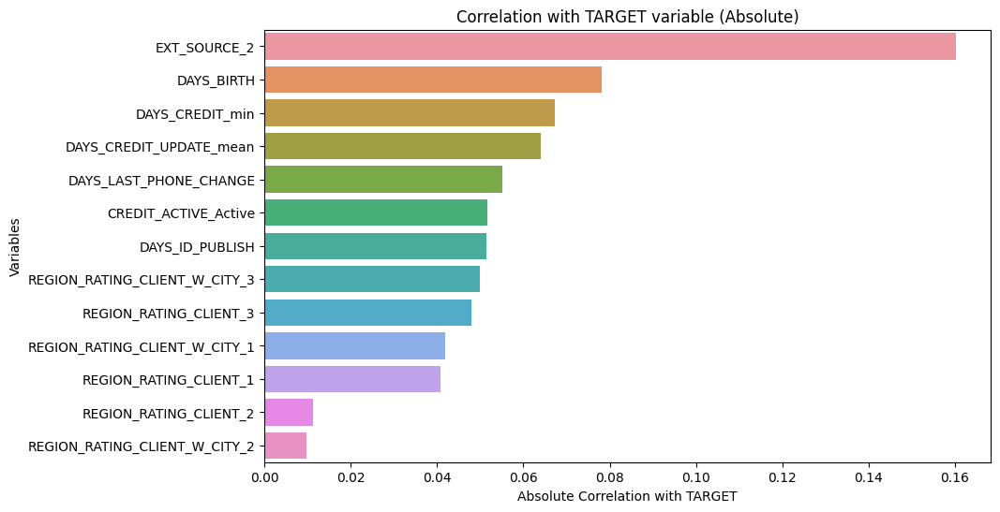

In [ ]:
# Compute the correlation matrix

corr_matrix = data.corr()

corr_without_target = corr_matrix.drop('TARGET')['TARGET'].abs().sort_values(ascending=False)

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=corr_without_target.values, y=corr_without_target.index, orient='h')
plt.xlabel('Absolute Correlation with TARGET')
plt.ylabel('Variables')
plt.title('Correlation with TARGET variable (Absolute)')
plt.show()

In [ ]:
data.columns = ['y','x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7','x8','x9','x10','x11','x12','x13']
data.head(5)

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13
0,1,-2120,2,-1134.0,0,1,0,0,1,0,-499.875000,-1437.0,-9461,0.262949
1,0,-291,1,-828.0,1,0,0,1,0,0,-816.000000,-2586.0,-16765,0.622246
2,0,-2531,2,-815.0,0,1,0,0,1,0,-532.000000,-1326.0,-19046,0.555912
3,0,-2437,2,-617.0,0,1,0,0,1,0,-481.833333,-1827.0,-19005,0.650442
4,0,-3458,2,-1106.0,0,1,0,0,1,0,-783.000000,-1149.0,-19932,0.322738


In [ ]:
x = data[['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7','x8','x9','x10','x11','x12','x13']]
y = data['y']

### Visualisasi

#### Univariat

In [ ]:
#Visualisasi Pie Chart untuk Y
import plotly.express as px
print(data['TARGET'].unique())
y_value_counts = data['TARGET'].value_counts()
print("Number of customers who will not repay the loan on time: ", y_value_counts[1], ", (", (y_value_counts[1]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print("Number of customers who will repay the loan on time: ", y_value_counts[0], ", (", (y_value_counts[0]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")

print("Terlihat bahwa dataset tidak seimbang dan lebih didominasi oleh 'Will Repay'")
px.pie(data,names=data.TARGET.map({0:"Will Repay",1:"Will Not Repay"}))

[1 0]
Number of customers who will not repay the loan on time:  1862 , ( 7.985247448323183 %)
Number of customers who will repay the loan on time:  21456 , ( 92.01475255167682 %)
Terlihat bahwa dataset tidak seimbang dan lebih didominasi oleh 'Will Repay'


Berdasarkan pie chart didapatkan bahwa sebanyak 92% konsumen credit card dapat membayar dan 7,99% tidak dapat membayar

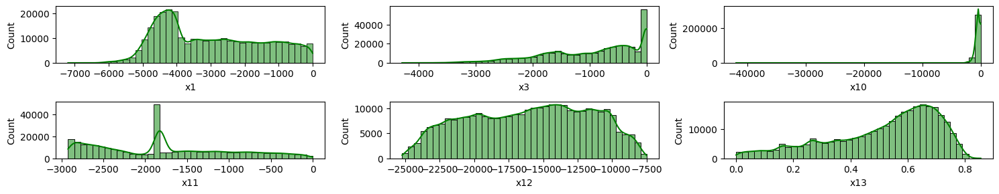

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

nums=[ 'x1','x3','x10','x11','x12','x13']
#histplot
plt.figure(figsize=(15, 4))
for i in range(0, len(nums)):
    plt.subplot(3, 3, i+1)
    sns.histplot(x[nums[i]], color='green', kde=True, bins = 40)
    plt.tight_layout()

In [ ]:
#mengubah tipe data x2 yang tadinya numerik menjadi objek
x['x2']=x['x2'].astype('object') #Untuk variabel x2


#Visualisasi Pie Chart untuk credit status
import plotly.express as px
print(x['x2'].unique())
x2_value_counts = x['x2'].value_counts()
print("Number of customer's credit status = active: ", x2_value_counts[2.0], ", (", (x2_value_counts[2.0]/(x2_value_counts[2.0]+x2_value_counts[1.0]))*100,"%)")
print("Number of customer's credit status = not active:", x2_value_counts[1.0], ", (", (x2_value_counts[1.0]/(x2_value_counts[2.0]+x2_value_counts[1.0]))*100,"%)")

px.pie(x,names=x.x2.map({1.0:"not active",2.0:"active"}))


[2.0 1.0 4.0 3.0 5.0 6.0 7.0 8.0 10.0 9.0 11.0 12.0 13.0 14.0 17.0 20.0
 19.0 15.0 22.0 16.0 18.0 32.0]
Number of customer's credit status = active:  148744 , ( 66.747140414724 %)
Number of customer's credit status = not active: 74103 , ( 33.252859585276 %)


Berdasarkan pie chart diatas didapatkan bahwa mayoritas pengguna kredit card sebanyak 48.4% masih aktif, 24.1% tidak aktif, dan 27.5% tidak diketahui

In [ ]:
#mengubah tipe data x4 dan x5 yang tadinya numerik menjadi objek
df['REGION_RATING_CLIENT']=df['REGION_RATING_CLIENT'].astype('object') #Untuk variabel x4
df['REGION_RATING_CLIENT_W_CITY']=df['REGION_RATING_CLIENT_W_CITY'].astype('object') #Untuk variabel x5


Region Rating Clientnya adalah sebagai berikut :


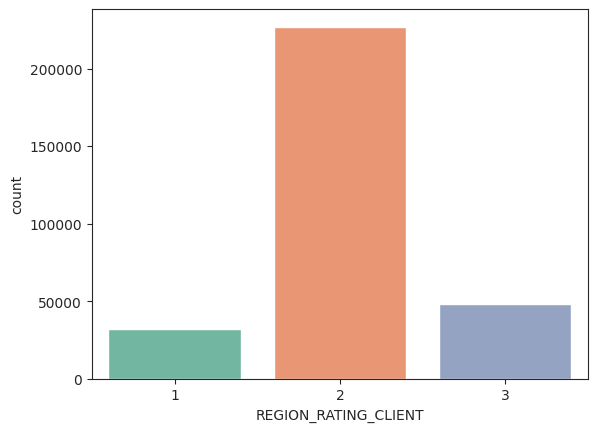

In [ ]:
#Vertikal
sns.set_style('ticks') #mengatur style dari barplot
sns.countplot(data=df, x="REGION_RATING_CLIENT",palette = 'Set2') # karena cuma menggunakan 1 variabel dan variabel x yang didefinisikan artinya barplot akan berorientasi vertikal

print("Region Rating Clientnya adalah sebagai berikut :")
plt.show() #untuk menampilkan barplot



Region Rating Client W Citynya (x5) adalah sebagai berikut :


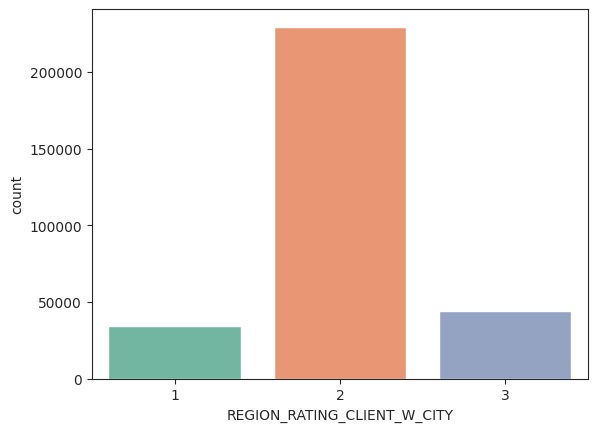

In [ ]:
#Vertikal
sns.set_style('ticks') #mengatur style dari barplot
sns.countplot(data=df, x='REGION_RATING_CLIENT_W_CITY',palette = 'Set2') # karena cuma menggunakan 1 variabel dan variabel x yang didefinisikan artinya barplot akan berorientasi vertikal

print("Region Rating Client W Citynya (x5) adalah sebagai berikut :")
plt.show() #untuk menampilkan barplot

#### Bivariat

In [ ]:
#Mengelompokkan data numerik
nums = [i for i in df_new.columns if df_new[i].dtype != 'object' and i != 'TARGET']

In [ ]:
#Mengelompokkan data kategorik
cats = [i for i in df_new.columns if df_new[i].dtype == 'object' and i != 'TARGET']

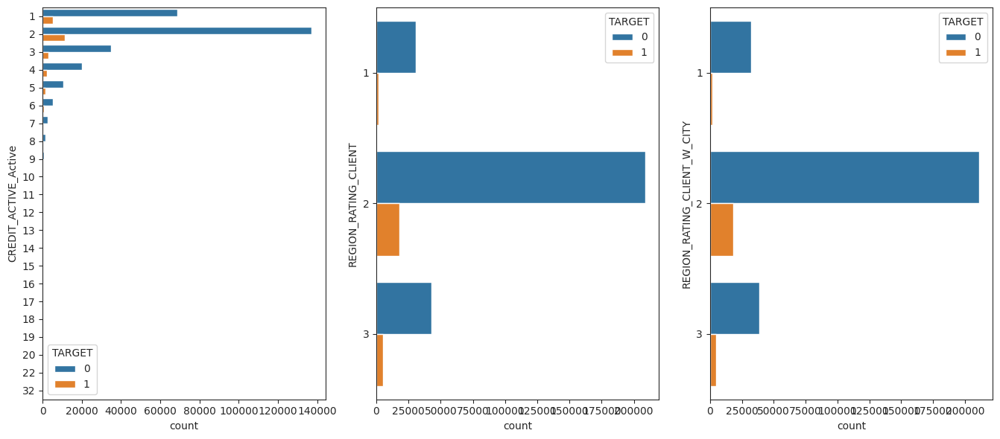

In [ ]:
#Bivariate Analysis data kategorik menggunakan countplot
plt.figure(figsize = (18, 6))
for i in range(0, len(cats)):
  plt.subplot(1, 4, i+1)
  sns.countplot(y = df_new[cats[i]], hue = df_new['TARGET'], orient = 'v')
  plt.tight_layout()

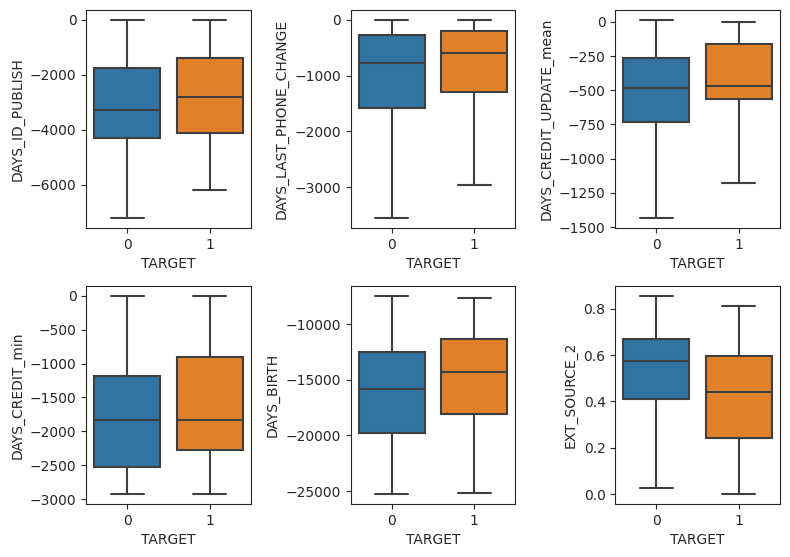

In [ ]:
#Bivariate Analysis data numerik menggunakan boxplot
plt.figure(figsize = (8,8))
for i in range(0, len(nums)):
  plt.subplot(3, 3, i+1)
  sns.boxplot(y = df_new[nums[i]], x = df_new['TARGET'], orient = 'v', showfliers = False)
  plt.tight_layout()

Berdasarkan boxplot tersebut dapat disimpulkan bahwa tidak terjadi outlier pada variabel numerik

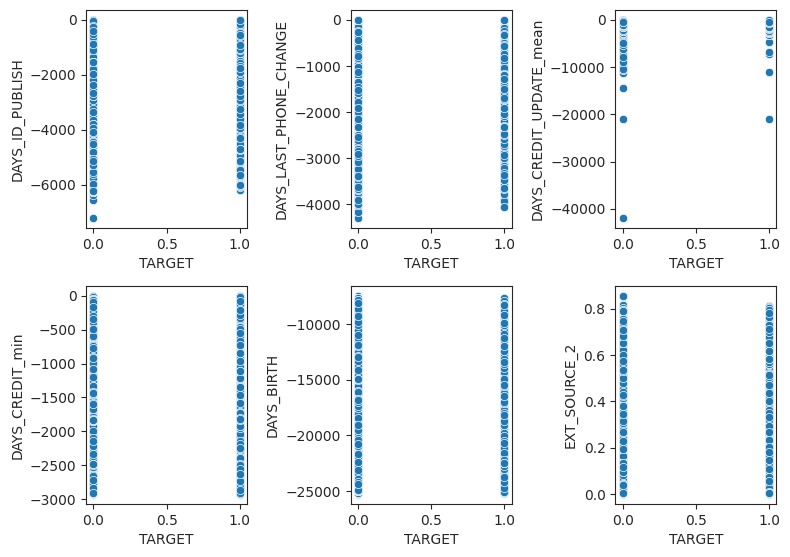

In [ ]:
plt.figure(figsize = (8,8))
for i in range(0, len(nums)):
  plt.subplot(3, 3, i+1)
  sns.scatterplot(x='TARGET', y=nums[i], data=df_new)
  plt.tight_layout()
# Menampilkan scatter plot
plt.show()

# Modelling dan analisis

Adapun beberapa model yang kelompok kami pilih yaitu
1. Regresi Logistik
2. Decision Tree
3. Support Vector Machine
4. Naive Bayes
5. Random Forest
6. XGboost
XGB Weighted

Dikarenakan tujuan utuma kita adalah  mengidentifikasi sebanyak mungkin kasus positif (kejadian positif) dengan sedikit false negative (kasus positif yang salah diklasifikasikan sebagai negatif maka kita melihat nilai recall pada model tertinggi dan fokus pada kode 1 (yang menandakan pelanggan tidak dapat bayar)


In [ ]:
from sklearn.model_selection import train_test_split

# Membagi data menjadi data latih dan data uji
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
def confusion_matrix_graph(ax, cnf_matrix):
  sns.heatmap(cnf_matrix, annot=True, fmt="d", cmap="PiYG", ax=ax)
  ax.set_title("Confusion Matrix")
  ax.set_xlabel("Actual Value")
  ax.set_ylabel("Predicted Value")
  ax.xaxis.set_ticklabels(['0', '1'])
  ax.yaxis.set_ticklabels(['0', '1'])

### Regresi Logistik

Regresi Logistik adalah salah satu metode dalam statistika yang digunakan untuk memodelkan hubungan antara variabel independen dengan variabel respon biner. Variabel respon biasanya memiliki dua kategori, seperti sukses/kegagalan, ya/tidak, atau 1/0. Regresi Logistik bertujuan untuk memahami dan memprediksi probabilitas kejadian variabel respon yang bersifat biner berdasarkan variabel independen yang terkait.

In [ ]:
# Mengimpor modul yang diperlukan
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Membagi data menjadi data latih dan data uji
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Membangun model regresi logistik biner
logreg = LogisticRegression()

# Melatih model menggunakan data latih
logreg.fit(X_train, y_train)

# Memprediksi data uji menggunakan model yang telah dilatih
y_pred_logreg = logreg.predict(X_test)

# Evaluasi model
print(classification_report(y_test, y_pred_logreg))

# Menghitung akurasi model
accuracy_logreg = accuracy_score(y_test, y_pred_logreg)

# Menampilkan akurasi model
print("Accuracy:", accuracy_logreg)

# Menapilkan Confusion Matrix
cnf_logreg = confusion_matrix(y_test, y_pred_logreg)
print(cnf_logreg)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56554
           1       0.64      0.00      0.00      4949

    accuracy                           0.92     61503
   macro avg       0.78      0.50      0.48     61503
weighted avg       0.90      0.92      0.88     61503

Accuracy: 0.9195811586426679
[[56550     4]
 [ 4942     7]]


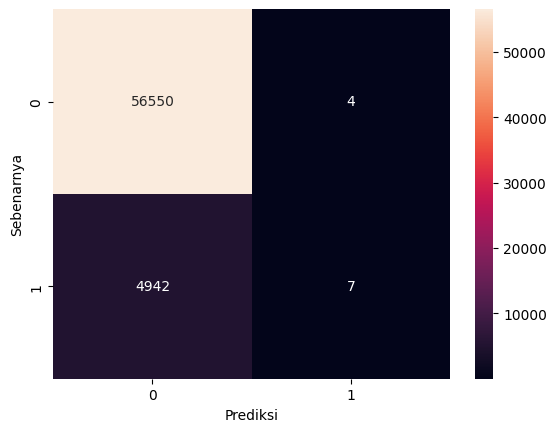

In [ ]:
# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred_logreg)

# Membuat heatmap dari Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d")

# Memberikan label pada sumbu x dan y
plt.xlabel("Prediksi")
plt.ylabel("Sebenarnya")

# Menampilkan plot
plt.show()

## Decision Tree

Model Decision Tree cocok untuk memprediksi hubungan dengan variabel respon biner karena dapat menangani fitur diskret dan kontinu, mengidentifikasi hubungan non-linear, dan menghasilkan aturan yang mudah diinterpretasikan.

In [ ]:
# Mengimpor modul yang diperlukan
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Membangun model pohon keputusan
clf = DecisionTreeClassifier()

# Melatih model menggunakan data latih
clf.fit(X_train, y_train)

# Memprediksi data uji menggunakan model yang telah dilatih
y_pred_clf = clf.predict(X_test)

# Evaluasi model
print(classification_report(y_test, y_pred_clf))

# Menghitung akurasi model
accuracy_clf = accuracy_score(y_test, y_pred_clf)

# Menampilkan akurasi model
print("Accuracy:", accuracy_clf)

# Menampilkan Confusion Matrix
cnf_clf = confusion_matrix(y_test, y_pred_clf)
print(cnf_clf)

              precision    recall  f1-score   support

           0       0.92      0.91      0.92     56554
           1       0.13      0.15      0.13      4949

    accuracy                           0.85     61503
   macro avg       0.52      0.53      0.53     61503
weighted avg       0.86      0.85      0.85     61503

Accuracy: 0.849389460676715
[[51519  5035]
 [ 4228   721]]


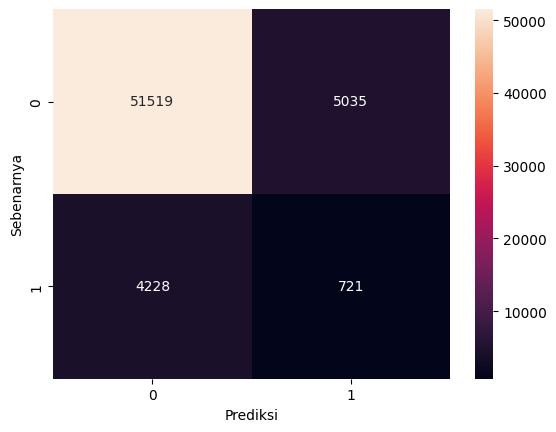

In [ ]:
# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred_clf)

# Membuat heatmap dari Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d")

# Memberikan label pada sumbu x dan y
plt.xlabel("Prediksi")
plt.ylabel("Sebenarnya")

# Menampilkan plot
plt.show()

## Support Vector Machine

Model Support Vector Machine (SVM) cocok untuk memprediksi hubungan dengan variabel respon biner karena SVM dapat mengatasi masalah dengan dataset yang tidak terdistribusi secara linear. SVM menggunakan hyperplane untuk memisahkan dua kelas, dengan memaksimalkan margin antara kedua kelas tersebut. Selain itu, SVM juga dapat mengatasi masalah overfitting dengan menggunakan fungsi kernel untuk mengubah ruang fitur menjadi dimensi yang lebih tinggi, sehingga memungkinkan SVM untuk menemukan keputusan pemisah yang kompleks.

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Membangun model SVM
clf = SVC()

# Melatih model menggunakan data latih
clf.fit(X_train, y_train)

# Memprediksi data uji menggunakan model yang telah dilatih
y_pred_svm = clf.predict(X_test)

# Evaluasi model menggunakan classification report
report = classification_report(y_test, y_pred_svm)
print(report)

# Menghitung akurasi model
accuracy_svm = accuracy_score(y_test, y_pred_svm)

# Menampilkan akurasi model
print("Accuracy:", accuracy_svm)

# Menampilkan confusion matrix
cnf_svm = confusion_matrix(y_test, y_pred_svm)
print(cnf_svm)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56554
           1       0.00      0.00      0.00      4949

    accuracy                           0.92     61503
   macro avg       0.46      0.50      0.48     61503
weighted avg       0.85      0.92      0.88     61503

Accuracy: 0.9195323805342829
[[56554     0]
 [ 4949     0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


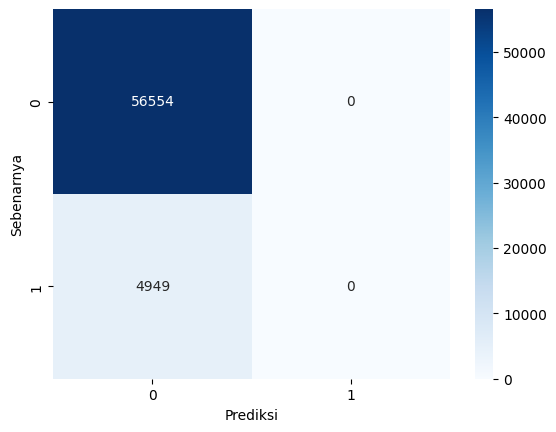

In [ ]:
# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred_svm)

# Membuat heatmap dari Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Memberikan label pada sumbu x dan y
plt.xlabel("Prediksi")
plt.ylabel("Sebenarnya")

# Menampilkan plot
plt.show()

## Naive Bayes

Model statistika Naive Bayes cocok untuk memprediksi hubungan dengan variabel respon biner karena metode ini didasarkan pada teorema Bayes dan asumsi Naive Bayes yang menyederhanakan perhitungan probabilitas. Naive Bayes dapat mengatasi masalah dengan dataset yang memiliki banyak fitur, karena menganggap bahwa setiap fitur saling independen. Model ini juga efisien dalam penggunaan memori dan waktu komputasi.

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Membangun model Naive Bayes
nb = GaussianNB()

# Melatih model menggunakan data latih
nb.fit(X_train, y_train)

# Memprediksi data uji menggunakan model yang telah dilatih
y_pred_nb = nb.predict(X_test)

# Evaluasi model menggunakan classification report
report = classification_report(y_test, y_pred_nb)
print(report)

# Menghitung akurasi model
accuracy_nb = accuracy_score(y_test, y_pred_nb)

# Menampilkan akurasi model
print("Accuracy:", accuracy_nb)

# Menampilkan confusion matrix
cnf_nb = confusion_matrix(y_test, y_pred_nb)
print(cnf_nb)

              precision    recall  f1-score   support

           0       0.93      0.95      0.94     56554
           1       0.19      0.14      0.16      4949

    accuracy                           0.88     61503
   macro avg       0.56      0.55      0.55     61503
weighted avg       0.87      0.88      0.87     61503

Accuracy: 0.8819732370778661
[[53531  3023]
 [ 4236   713]]


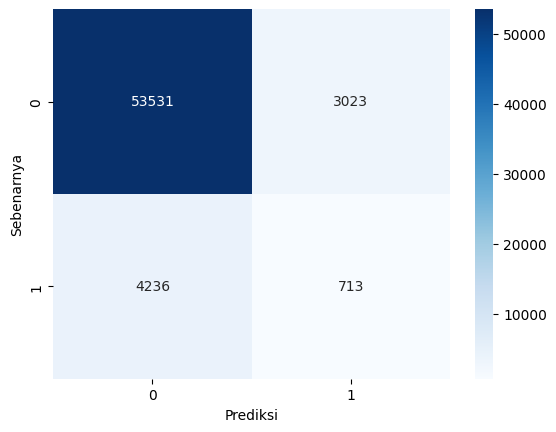

In [ ]:
# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred_nb)

# Membuat heatmap dari Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Memberikan label pada sumbu x dan y
plt.xlabel("Prediksi")
plt.ylabel("Sebenarnya")

# Menampilkan plot
plt.show()

## Random Forest

Random Forest adalah sebuah metode ensemble learning yang digunakan dalam machine learning untuk melakukan prediksi. Metode ini terdiri dari sejumlah besar pohon keputusan yang bekerja secara independen dan menghasilkan prediksi. Setiap pohon di dalam Random Forest dibangun berdasarkan subset acak dari data pelatihan, dan akhirnya hasil prediksi dari masing-masing pohon digabungkan untuk menghasilkan prediksi akhir.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Membangun model Random Forest
rf = RandomForestClassifier()

# Melatih model menggunakan data latih
rf.fit(X_train, y_train)

# Memprediksi data uji menggunakan model yang telah dilatih
y_pred_rf = rf.predict(X_test)

# Evaluasi model menggunakan classification report
report = classification_report(y_test, y_pred_rf)
print(report)

# Menghitung akurasi model
accuracy_rf = accuracy_score(y_test, y_pred_rf)

# Menampilkan akurasi model
print("Accuracy:", accuracy_rf)

# Menampilkan confusion matrix
cnf_rf = confusion_matrix(y_test, y_pred_rf)
print(cnf_rf)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56554
           1       0.41      0.01      0.01      4949

    accuracy                           0.92     61503
   macro avg       0.67      0.50      0.49     61503
weighted avg       0.88      0.92      0.88     61503

Accuracy: 0.9192884899923581
[[56503    51]
 [ 4913    36]]


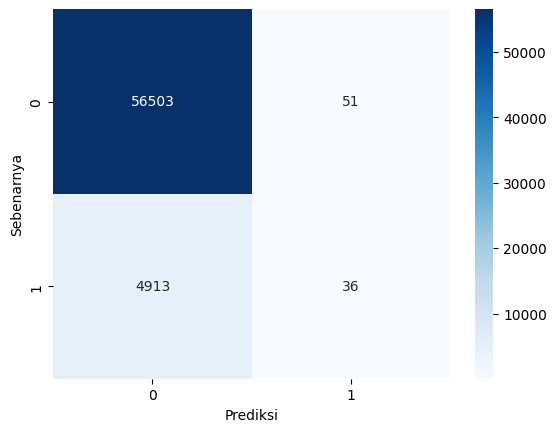

In [ ]:
# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred_rf)

# Membuat heatmap dari Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Memberikan label pada sumbu x dan y
plt.xlabel("Prediksi")
plt.ylabel("Sebenarnya")

# Menampilkan plot
plt.show()

## XGboost

XGBoost (Extreme Gradient Boosting) adalah sebuah algoritma ensemble learning yang sangat populer dalam machine learning untuk memprediksi hubungan dengan respon biner atau masalah regresi. XGBoost menggunakan pendekatan pohon keputusan berurutan dan menggabungkan hasil prediksi dari sejumlah pohon keputusan yang lemah (weak learners) untuk menghasilkan prediksi akhir yang lebih kuat.

In [ ]:
import xgboost as xgb
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Mengubah data ke dalam format DMatrix yang digunakan oleh XGBoost
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test)

# Menentukan parameter untuk XGBoost
params = {
    'objective': 'binary:logistic',  # Untuk masalah klasifikasi biner
    'eval_metric': 'logloss'  # Metrik evaluasi
}

# Melatih model XGBoost menggunakan data latih
model = xgb.train(params, dtrain)

# Memprediksi data uji menggunakan model yang telah dilatih
y_pred = model.predict(dtest)

# Konversi hasil prediksi menjadi label biner
y_pred_binary = [1 if pred >= 0.5 else 0 for pred in y_pred]

# Evaluasi model
print(classification_report(y_test, y_pred_binary))

# Menghitung akurasi model
accuracy_binary = accuracy_score(y_test, y_pred_binary)

# Menampilkan akurasi model
print("Accuracy:", accuracy_binary)

# Menampilkan confusion matrix
cnf_binary = confusion_matrix(y_test, y_pred_binary)
print(cnf_binary)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56554
           1       0.55      0.00      0.00      4949

    accuracy                           0.92     61503
   macro avg       0.73      0.50      0.48     61503
weighted avg       0.89      0.92      0.88     61503

Accuracy: 0.9195486399037446
[[56549     5]
 [ 4943     6]]


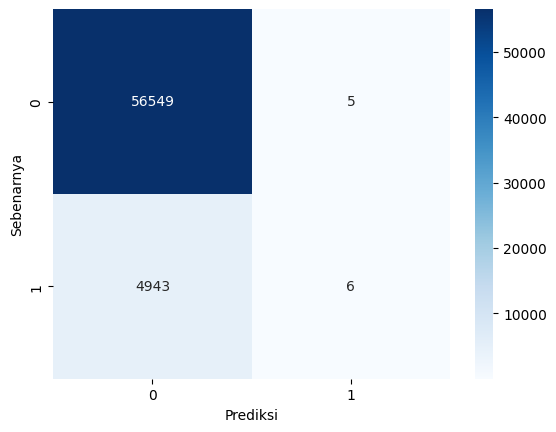

In [ ]:
# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Membuat heatmap dari Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Memberikan label pada sumbu x dan y
plt.xlabel("Prediksi")
plt.ylabel("Sebenarnya")

# Menampilkan plot
plt.show()

## XGB Weighted

XGBoost Weighted merujuk pada penggunaan bobot (weights) dalam algoritma XGBoost. Dalam konteks XGBoost, penggunaan bobot memberikan kemampuan untuk memberikan perhatian lebih kepada sampel-sampel yang penting atau langka dalam dataset pelatihan.Kegunaan utama XGBoost Weighted adalah untuk mengatasi masalah ketidakseimbangan kelas (class imbalance) dalam data biner, di mana jumlah sampel dalam satu kelas jauh lebih banyak daripada yang lain.

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

weight = len(y[y==0]) / len(y[y==1])
model_xgb_balanced = XGBClassifier(scale_pos_weight = weight, use_label_encoder = False, eval_metric = 'auc')
model_xgb_balanced.fit(X_train, y_train)
y_predict_xgb_balanced = model_xgb_balanced.predict(X_test)

# Evaluasi model
print(classification_report(y_test, y_predict_xgb_balanced))

# Menghitung akurasi model
accuracy_xgb_balanced = accuracy_score(y_test, y_predict_xgb_balanced)

# Menampilkan akurasi model
print("Accuracy:", accuracy_xgb_balanced)

# Menampilkan confusion matrix
cnf_xgb_balanced = confusion_matrix(y_test, y_predict_xgb_balanced)
print(cnf_xgb_balanced)

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


              precision    recall  f1-score   support

           0       0.95      0.69      0.80     56554
           1       0.14      0.58      0.23      4949

    accuracy                           0.69     61503
   macro avg       0.55      0.64      0.52     61503
weighted avg       0.88      0.69      0.76     61503

Accuracy: 0.6853649415475668
[[39289 17265]
 [ 2086  2863]]


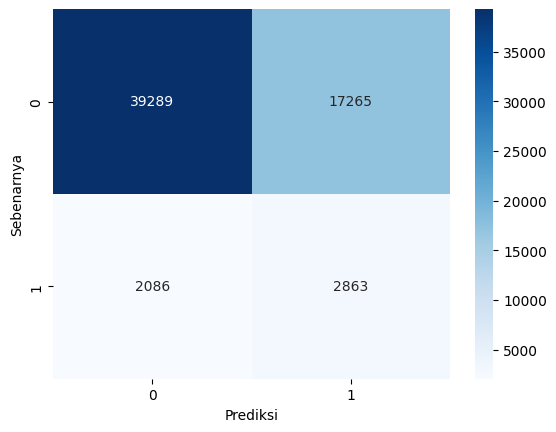

In [ ]:
# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_predict_xgb_balanced)

# Membuat heatmap dari Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Memberikan label pada sumbu x dan y
plt.xlabel("Prediksi")
plt.ylabel("Sebenarnya")

# Menampilkan plot
plt.show()

Heatmap Confusion Matrix tersebut dapat menunjukkan jumlah prediksi yang benar (True Positives dan True Negatives) serta jumlah prediksi yang salah (False Positives dan False Negatives).

# Evaluasi Model

### Kesimpulan Evaluasi Model

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, recall_score, confusion_matrix

evaluation_dictionary = {
    'Model': ['Regresi Logistik', "Decision Tree", "SVM", "Naive Bayes", "Random Forest", "XGB", "XGB Weighted"],
    'Accuracy': [accuracy_logreg, accuracy_clf, accuracy_svm, accuracy_nb, accuracy_rf, accuracy_binary, accuracy_xgb_balanced],
    'Confusion Matrix': [cnf_logreg, cnf_clf, cnf_svm, cnf_nb, cnf_rf, cnf_binary, cnf_xgb_balanced]
}

evaluation_dictionary = pd.DataFrame(evaluation_dictionary)

evaluation_dictionary

,Model,Accuracy,Confusion Matrix
0,Regresi Logistik,0.919581,"[[56550, 4], [4942, 7]]"
1,Decision Tree,0.849389,"[[51519, 5035], [4228, 721]]"
2,SVM,0.919532,"[[56554, 0], [4949, 0]]"
3,Naive Bayes,0.881973,"[[53531, 3023], [4236, 713]]"
4,Random Forest,0.919288,"[[56503, 51], [4913, 36]]"
5,XGB,0.919549,"[[56549, 5], [4943, 6]]"
6,XGB Weighted,0.685365,"[[39289, 17265], [2086, 2863]]"


**Kesimpulan Model**

Berdasarkan nilai recall dan confusion matrix, didapatkan bahwa model terbaik dan cocok digunakan untuk data Home Credit Card adalah XGB Weighted karena memiliki nilai recall terbesar dan confusion matrix yang cukup seimbang

## Evaluasi umum model

Pada evaluasi CRISP-DM (Cross-Industry Standard Process for Data Mining) untuk model regresi logistik, terdapat beberapa hal yang diperlukan untuk menguji model yang telah dibangun. Beberapa evaluasi yang umum dilakukan meliputi:

1. Evaluasi Performa dengan ROC curve
2. Cross Validation

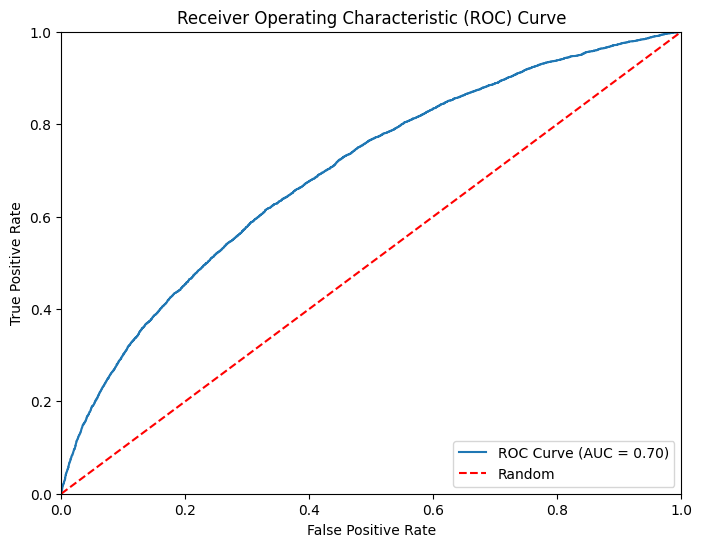

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Memprediksi probabilitas kelas positif dari data uji
y_pred_proba = xgb.predict_proba(X_test)[:, 1]

# Menghitung False Positive Rate (FPR), True Positive Rate (TPR), dan ambang batas (threshold) pada kurva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Menghitung Area Under Curve (AUC) dari kurva ROC
auc = roc_auc_score(y_test, y_pred_proba)

# Plotting kurva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC Curve (AUC = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], 'r--', label='Random')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

AUC (Area Under Curve) memiliki nilai 0.70, itu mengindikasikan bahwa model regresi logistik memiliki kinerja yang cukup baik dalam memprediksi kelas positif dan kelas negatif. AUC bernilai antara 0.5 hingga 1, di mana semakin mendekati 1, semakin baik model dalam membedakan antara kelas positif dan kelas negatif.

Dengan nilai AUC sebesar 0.70, model memiliki kemampuan yang lebih baik daripada prediksi yang acak (AUC = 0.5), tetapi masih memiliki ruang untuk ditingkatkan.

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

# Membangun model XGBoost
xgb = XGBClassifier()

# Melakukan cross-validation dengan 5 fold
scores = cross_val_score(xgb, x, y, cv=5, scoring='accuracy')

# Menampilkan hasil cross-validation
print('Hasil Cross-Validation:')
print('Akurasi: {:.2f}'.format(scores.mean()))

Hasil Cross-Validation:
Akurasi: 0.92


Dari hasil cross-validation tersebut didapatkan bahwa :

* Model XGB Weighted yang dibangun memiliki performa yang baik dalam memprediksi variabel respons biner.
* Akurasi sebesar 0.92 menunjukkan bahwa model dapat mengklasifikasikan data dengan tingkat keakuratan sekitar 92%.
* Nilai akurasi yang tinggi menunjukkan bahwa model memiliki kemampuan yang baik dalam menggeneralisasi dan memprediksi data baru.

## Persamaan Model

In [ ]:
from xgboost import XGBClassifier

# Membangun dan melatih model XGBoost
xgb = XGBClassifier()
xgb.fit(X_train, y_train)

# Mengeluarkan parameter model XGBoost
importance = xgb.feature_importances_
features = ['TARGET', 'DAYS_ID_PUBLISH', 'CREDIT_ACTIVE_Active',
            'DAYS_LAST_PHONE_CHANGE', 'REGION_RATING_CLIENT_1', 'REGION_RATING_CLIENT_2', 'REGION_RATING_CLIENT_3',
            'REGION_RATING_CLIENT_W_CITY_1', 'REGION_RATING_CLIENT_W_CITY_2', 'REGION_RATING_CLIENT_W_CITY_3',
            'DAYS_CREDIT_UPDATE_mean', 'DAYS_CREDIT_min', 'DAYS_BIRTH', 'EXT_SOURCE_2']

for feature, importance_score in zip(features, importance):
    print(f"Feature: {feature}, Importance Score: {importance_score}")

Feature: TARGET, Importance Score: 0.05785670876502991
Feature: DAYS_ID_PUBLISH, Importance Score: 0.09760718047618866
Feature: CREDIT_ACTIVE_Active, Importance Score: 0.05576436221599579
Feature: DAYS_LAST_PHONE_CHANGE, Importance Score: 0.06268589943647385
Feature: REGION_RATING_CLIENT_1, Importance Score: 0.038868021219968796
Feature: REGION_RATING_CLIENT_2, Importance Score: 0.05061481520533562
Feature: REGION_RATING_CLIENT_3, Importance Score: 0.09436435997486115
Feature: REGION_RATING_CLIENT_W_CITY_1, Importance Score: 0.04565567150712013
Feature: REGION_RATING_CLIENT_W_CITY_2, Importance Score: 0.07928182929754257
Feature: REGION_RATING_CLIENT_W_CITY_3, Importance Score: 0.08258204162120819
Feature: DAYS_CREDIT_UPDATE_mean, Importance Score: 0.06383763253688812
Feature: DAYS_CREDIT_min, Importance Score: 0.07406891137361526
Feature: DAYS_BIRTH, Importance Score: 0.19681252539157867


Berdasarkan metode XGB Weighted didapatkan perameter diatas